In [0]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#!p7zip -d "/content/drive/My Drive/NIDA/Project/Deep learning/augment_multi.7z"
#!unzip -O utf-8 "/content/drive/My Drive/NIDA/Project/Deep learning/augment_multi.zip"

In [0]:
from keras.preprocessing.image import ImageDataGenerator, img_to_array
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline

Using TensorFlow backend.


In [0]:
import tensorflow as tf
print(tf.__version__)
from numpy.random import seed
tf.compat.v1.set_random_seed(2475)
#tf.random.set_seed(112)

1.15.2


In [0]:
img_size = 256
batch_size = 512

In [0]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   validation_split=0.2)

In [0]:
train_set=train_datagen.flow_from_directory('./aument_multi',
                                            target_size=(img_size,img_size),
                                            color_mode='grayscale',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            subset='training')

Found 56803 images belonging to 55 classes.


In [0]:
test_set = train_datagen.flow_from_directory('./aument_multi',
                                            target_size = (img_size,img_size),
                                            color_mode='grayscale',
                                            batch_size = batch_size,
                                            shuffle=True,
                                            subset='validation')

Found 14169 images belonging to 55 classes.


In [0]:
#AlexNet
model = Sequential()

# 1st Convolutional Layer
model.add(Conv2D(filters=96, input_shape=(img_size,img_size, 1), kernel_size=(11,11), strides=(4,4), padding='valid', activation='relu'))
# Max Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# 2nd Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(11,11), strides=(1,1), padding='valid', activation='relu'))
# Max Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# 3rd Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu'))

# 4th Convolutional Layer
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu'))

# 5th Convolutional Layer
model.add(Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu'))
# Max Pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

# Passing it to a Fully Connected layer
model.add(Flatten())
# 1st Fully Connected Layer
model.add(Dense(128, input_shape=(img_size*img_size*1,), activation='relu'))
# Add Dropout to prevent overfitting
model.add(Dropout(0.4))

# 2nd Fully Connected Layer
#model.add(Dense(128, activation='relu'))
# Add Dropout
#model.add(Dropout(0.4))

# 3rd Fully Connected Layer
model.add(Dense(55, activation='softmax'))
# Add Dropout
#model.add(Dropout(0.4))

# Output Layer
#model.add(Dense(55, activation='softmax'))
print(model.summary())

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_51 (Conv2D)           (None, 62, 62, 96)        11712     
_________________________________________________________________
max_pooling2d_33 (MaxPooling (None, 31, 31, 96)        0         
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 21, 21, 256)       2973952   
_________________________________________________________________
max_pooling2d_34 (MaxPooling (None, 10, 10, 256)       0         
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 8, 8, 384)         885120    
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 6, 6, 384)         1327488   
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 4, 4, 256)       

In [0]:
from keras import backend as K
import tensorflow as tf
import keras
import functools
top5_acc = functools.partial(keras.metrics.top_k_categorical_accuracy, k=5)
top5_acc.__name__ = 'top5_acc'

In [0]:
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy', top5_acc])

In [0]:
step_size_train=train_set.n//train_set.batch_size
step_size_test=test_set.n//test_set.batch_size
history = model.fit_generator(train_set,
                              steps_per_epoch=step_size_train,
                              epochs = 100,
                              validation_data = test_set,
                              validation_steps=step_size_test)

Epoch 1/100
110/110 [==============================] - 44s 400ms/step - loss: 3.8805 - accuracy: 0.0491 - top5_acc: 0.2036 - val_loss: 3.7798 - val_accuracy: 0.0578 - val_top5_acc: 0.2337
Epoch 2/100
110/110 [==============================] - 45s 408ms/step - loss: 3.8228 - accuracy: 0.0543 - top5_acc: 0.2221 - val_loss: 3.7735 - val_accuracy: 0.0603 - val_top5_acc: 0.2444
Epoch 3/100
110/110 [==============================] - 45s 407ms/step - loss: 3.8116 - accuracy: 0.0618 - top5_acc: 0.2349 - val_loss: 3.8552 - val_accuracy: 0.0532 - val_top5_acc: 0.2182
Epoch 4/100
110/110 [==============================] - 45s 409ms/step - loss: 3.8577 - accuracy: 0.0550 - top5_acc: 0.2242 - val_loss: 3.7260 - val_accuracy: 0.0668 - val_top5_acc: 0.2539
Epoch 5/100
110/110 [==============================] - 45s 407ms/step - loss: 3.7353 - accuracy: 0.0695 - top5_acc: 0.2634 - val_loss: 3.6671 - val_accuracy: 0.0689 - val_top5_acc: 0.2892
Epoch 6/100
110/110 [==============================] - 45s 4

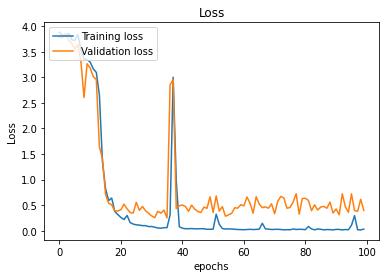

In [0]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.title('Loss')
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.legend(loc="upper left")
plt.show()

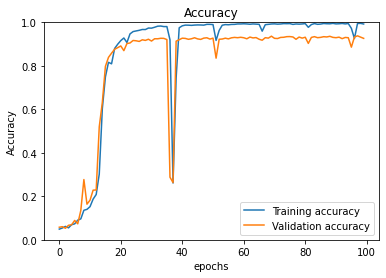

In [0]:
plt.plot(history.history['accuracy'], label='Training accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.ylim((0, 1))
plt.title('Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epochs')
plt.legend(loc="lower right")
plt.show()

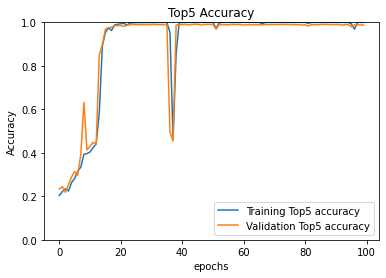

In [0]:
plt.plot(history.history['top5_acc'], label='Training Top5 accuracy')
plt.plot(history.history['val_top5_acc'], label='Validation Top5 accuracy')
plt.ylim((0, 1))
plt.title('Top5 Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epochs')
plt.legend(loc="lower right")
plt.show()

In [0]:
train_set.class_indices.keys()

dict_keys(['ก', 'ข', 'ฃ', 'ค', 'ฅ', 'ฆ', 'ง', 'จ', 'ฉ', 'ช', 'ซ', 'ฌ', 'ญ', 'ฎ', 'ฏ', 'ฐ', 'ฑ', 'ฒ', 'ณ', 'ด', 'ต', 'ถ', 'ท', 'ธ', 'น', 'บ', 'ป', 'ผ', 'ฝ', 'พ', 'ฟ', 'ภ', 'ม', 'ย', 'ร', 'ฤ', 'ล', 'ว', 'ศ', 'ษ', 'ส', 'ห', 'ฬ', 'อ', 'อะ', 'อา', 'อำ', 'ฮ', 'ฯ', 'เ', 'แ', 'โ', 'ใ', 'ไ', 'ๆ'])

In [0]:
model.save_weights("model.h5")
model_json = model.to_json()
with open("model_json.json", "w") as json_file:
    json_file.write(model_json)

In [0]:
def get_thai_char_by_idex(arr_idx):
    thai = ['ก', 'ข', 'ฃ', 'ค', 'ฅ', 'ฆ', 'ง', 'จ', 'ฉ', 'ช', 'ซ', 'ฌ', 'ญ', 'ฎ', 'ฏ',
            'ฐ', 'ฑ', 'ฒ', 'ณ', 'ด', 'ต', 'ถ', 'ท', 'ธ', 'น', 'บ', 'ป', 'ผ', 'ฝ', 'พ',
            'ฟ', 'ภ', 'ม', 'ย', 'ร', 'ฤ', 'ล', 'ว', 'ศ', 'ษ', 'ส', 'ห', 'ฬ', 'อ', 'อะ',
            'อา', 'อำ', 'ฮ', 'ฯ', 'เ', 'แ', 'โ', 'ใ', 'ไ', 'ๆ']

    result = []
    idx = arr_idx[0]
    # print("idx =========")
    # print(idx)

    for i in range(len(thai)):
        result.append((thai[i],idx[i]))

    sorted_by_second = sort_tuple(result)
    sorted_by_invert = sorted_by_second[::-1][:3]

    print("sort =======")
    print(sorted_by_invert)

    t = ""
    for i in range(len(sorted_by_invert)):
        t = t + sorted_by_invert[i][0]  + ":" + str(sorted_by_invert[i][1]) + "|"

    return t


def sort_tuple(tup):  
    tup.sort(key = lambda x: x[1])  
    return tup 

def auto_preduct(img):
  plt.imshow(img.reshape(256, 256), cmap='gray')
  plt.show()
  out = model.predict(img)
  response = get_thai_char_by_idex(out)

In [0]:
import cv2

img1 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/ก.png"
img2 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/ข.png"
img3 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/01-025.jpg"
img4 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/02-025.jpg"
img5 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/ก_AumC1.jpg"
img6 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/ข_AumC7.jpg"
img7 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/ก_ST01001-166.jpg"
img8 = "/content/drive/My Drive/NIDA/Project/Deep learning/Final project/ข_ST01005-1.jpg"

test_images = [img1, img2, img3, img4, img5, img6, img7, img8]

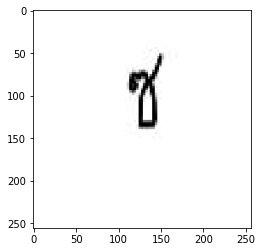

รูปบนนี้ทำนายว่าเป็น ซ
--------------------------------------------------


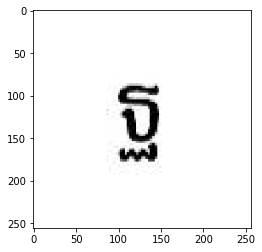

รูปบนนี้ทำนายว่าเป็น ฐ
--------------------------------------------------


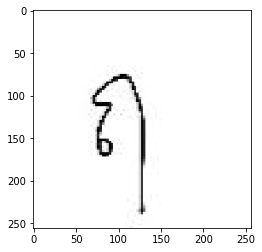

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


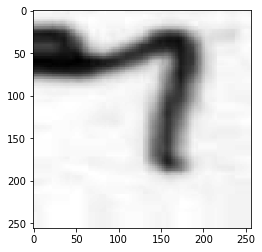

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


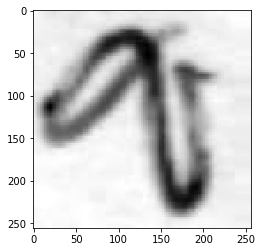

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


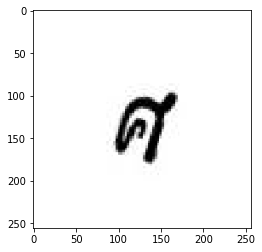

รูปบนนี้ทำนายว่าเป็น ศ
--------------------------------------------------


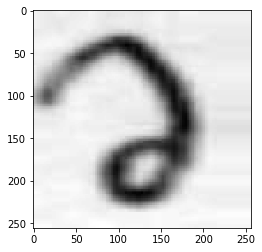

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


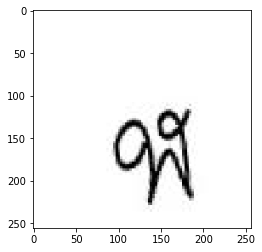

รูปบนนี้ทำนายว่าเป็น ฬ
--------------------------------------------------


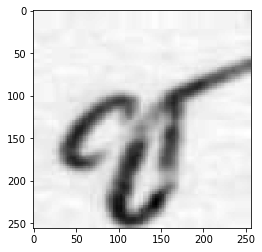

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


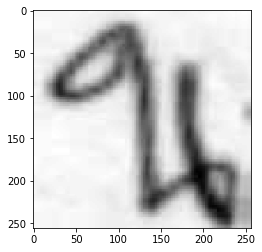

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


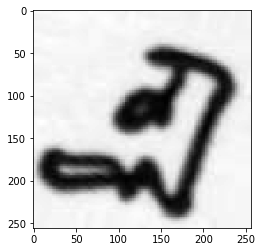

รูปบนนี้ทำนายว่าเป็น ฏ
--------------------------------------------------


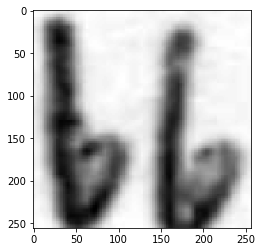

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


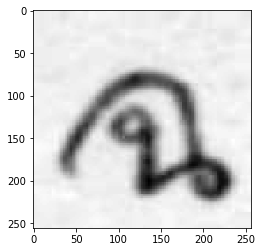

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


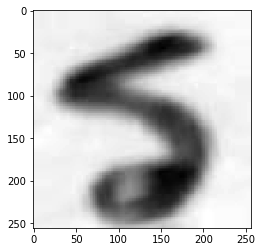

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


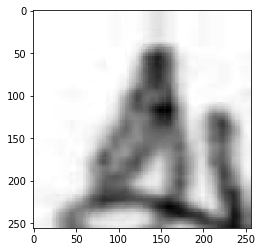

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


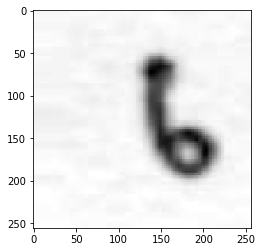

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


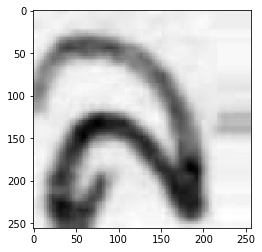

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


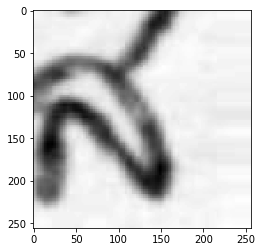

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


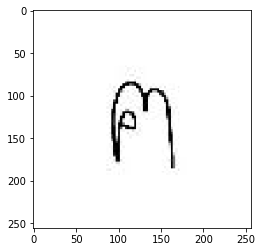

รูปบนนี้ทำนายว่าเป็น ฅ
--------------------------------------------------


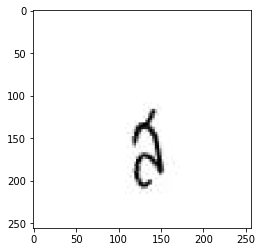

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


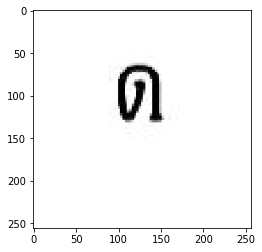

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


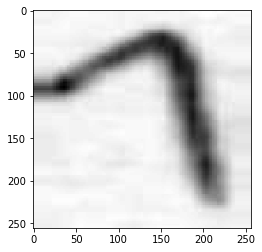

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


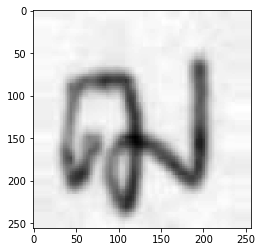

รูปบนนี้ทำนายว่าเป็น ฌ
--------------------------------------------------


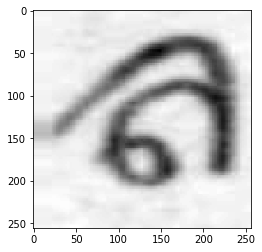

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


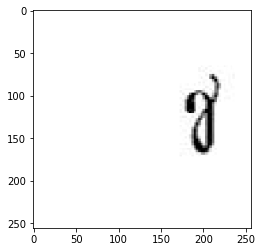

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


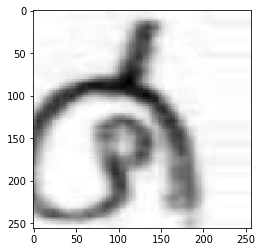

รูปบนนี้ทำนายว่าเป็น ศ
--------------------------------------------------


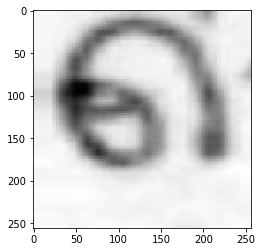

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


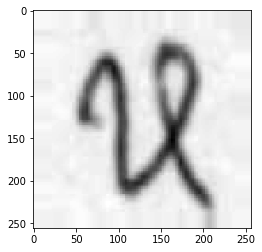

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


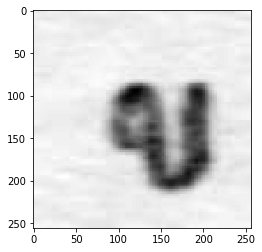

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


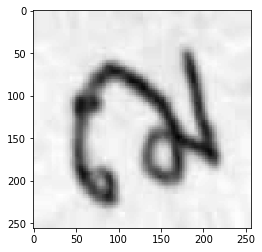

รูปบนนี้ทำนายว่าเป็น ฌ
--------------------------------------------------


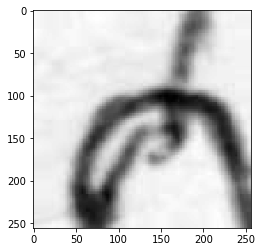

รูปบนนี้ทำนายว่าเป็น ศ
--------------------------------------------------


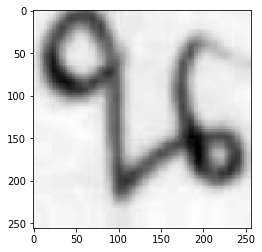

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


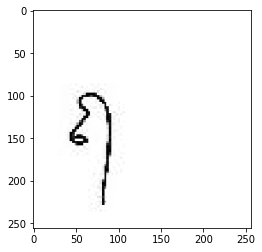

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


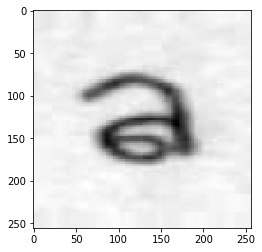

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


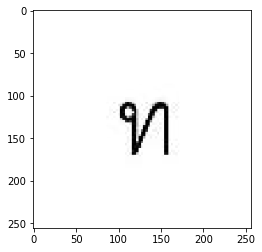

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


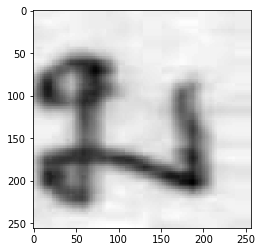

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


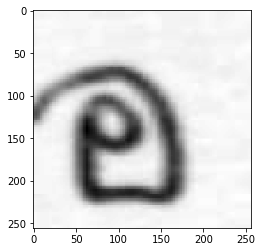

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


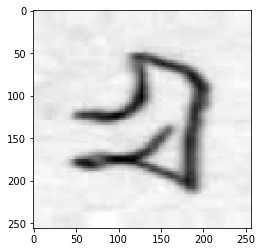

รูปบนนี้ทำนายว่าเป็น ฎ
--------------------------------------------------


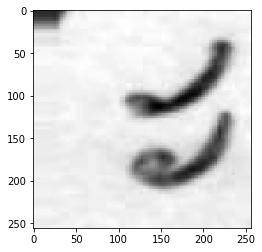

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


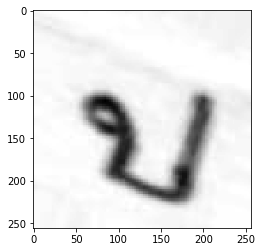

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


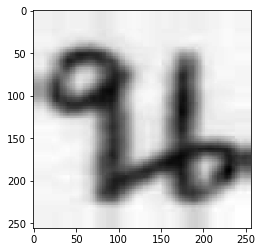

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


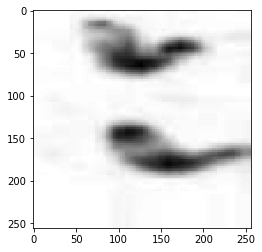

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


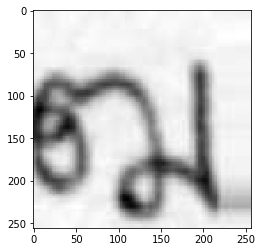

รูปบนนี้ทำนายว่าเป็น ฒ
--------------------------------------------------


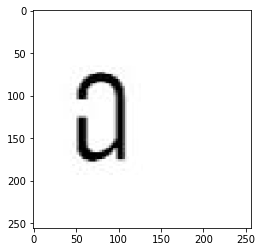

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


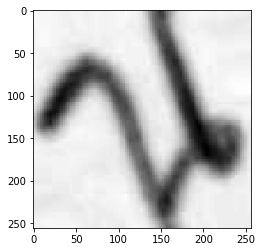

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


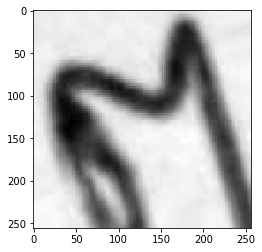

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


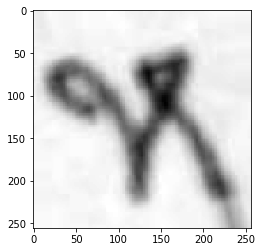

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


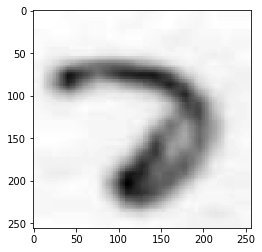

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


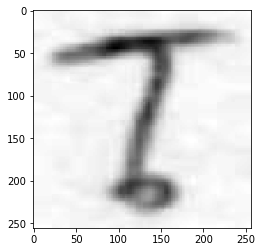

รูปบนนี้ทำนายว่าเป็น ฯ
--------------------------------------------------


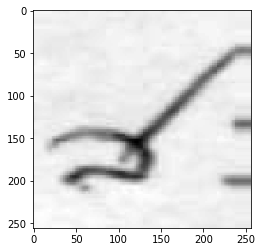

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


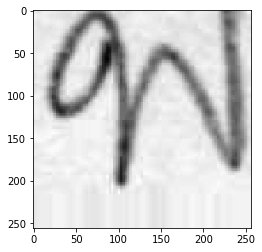

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


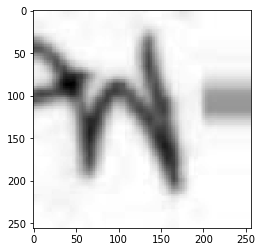

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


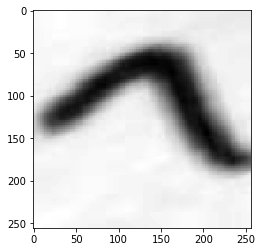

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


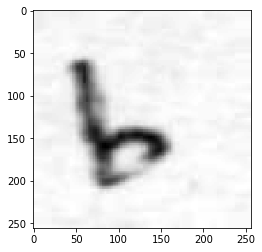

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


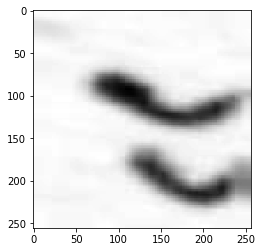

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


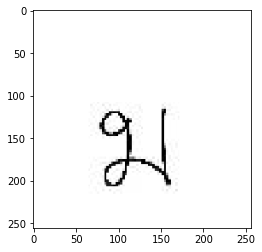

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


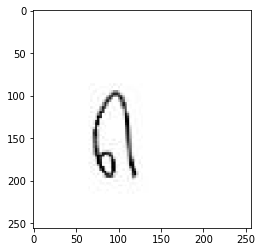

รูปบนนี้ทำนายว่าเป็น ถ
--------------------------------------------------


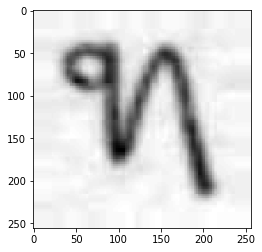

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


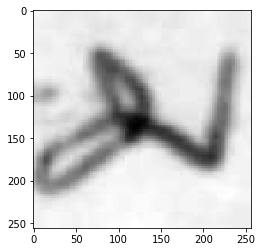

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


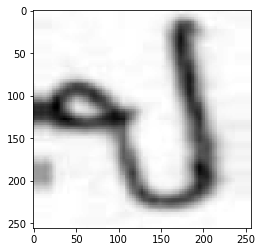

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


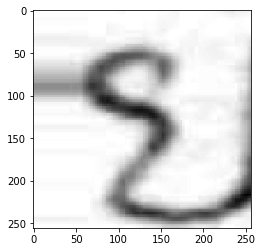

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


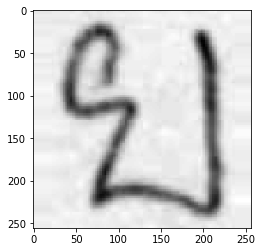

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


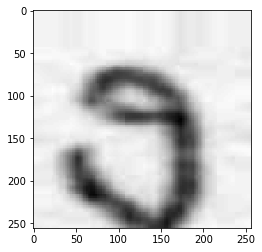

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


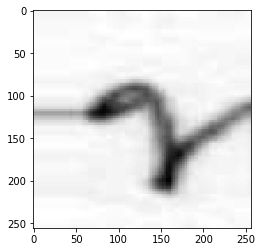

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


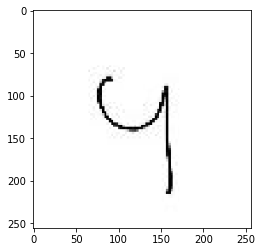

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


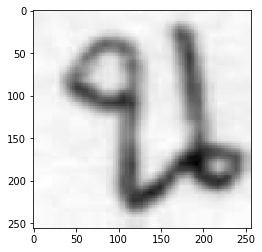

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


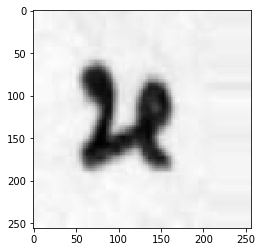

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


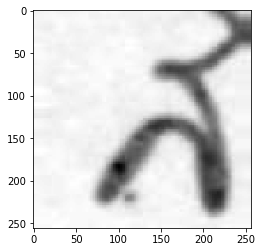

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


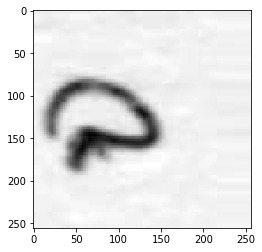

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


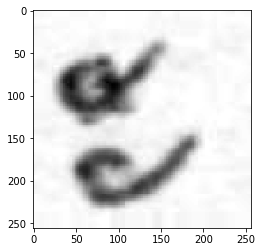

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


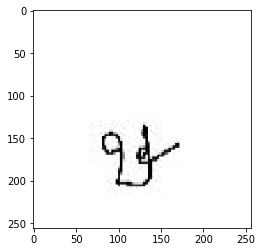

รูปบนนี้ทำนายว่าเป็น ษ
--------------------------------------------------


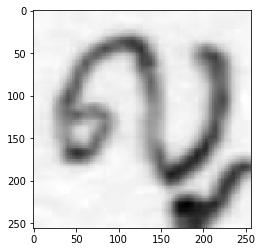

รูปบนนี้ทำนายว่าเป็น ญ
--------------------------------------------------


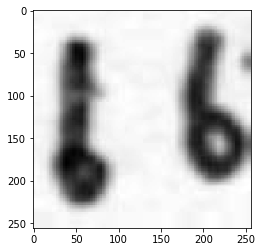

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


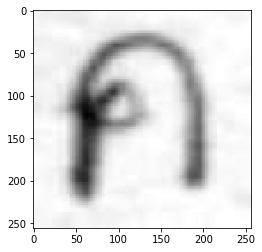

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


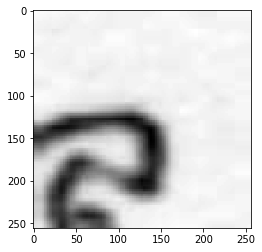

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


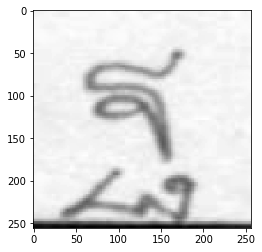

รูปบนนี้ทำนายว่าเป็น ฐ
--------------------------------------------------


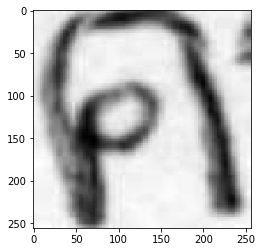

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


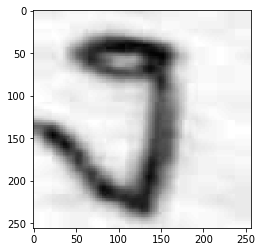

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


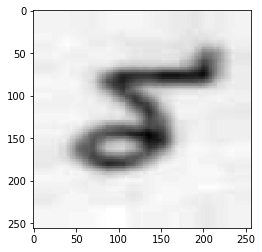

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


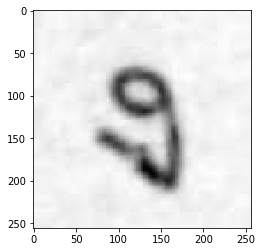

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


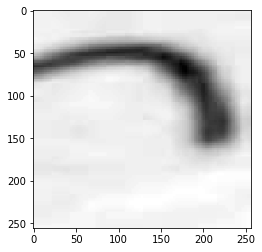

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


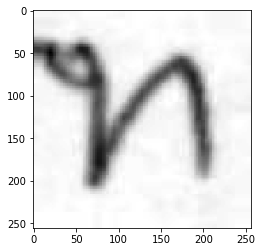

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


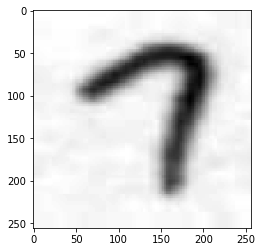

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


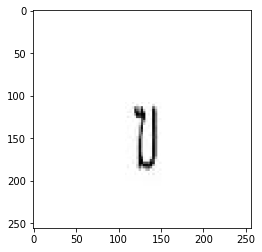

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


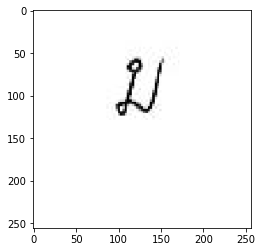

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


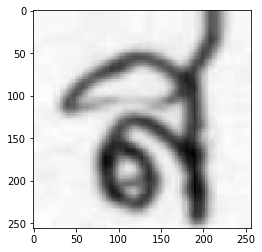

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


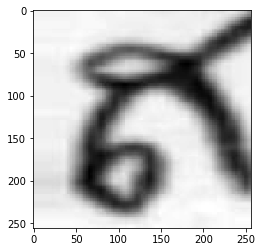

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


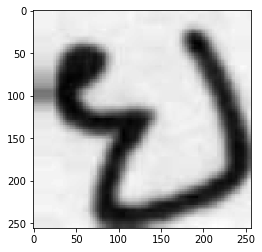

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


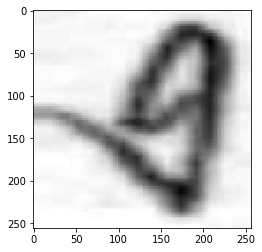

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


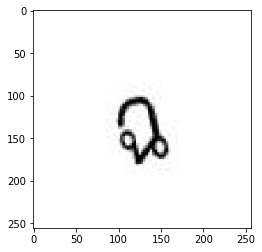

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


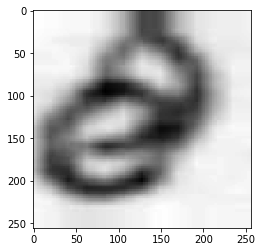

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


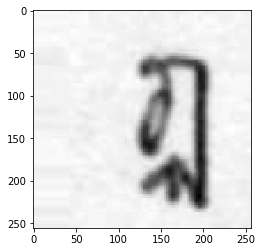

รูปบนนี้ทำนายว่าเป็น ฏ
--------------------------------------------------


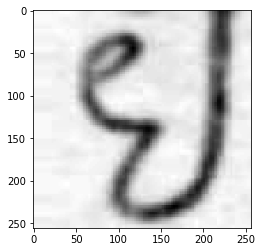

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


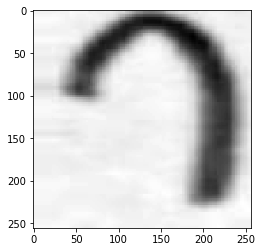

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


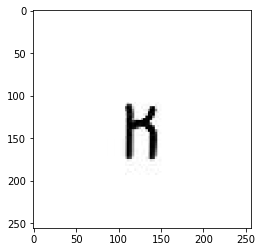

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


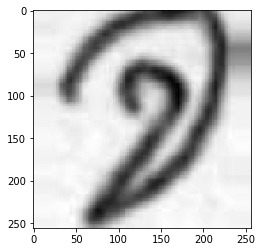

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


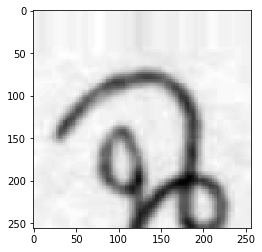

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


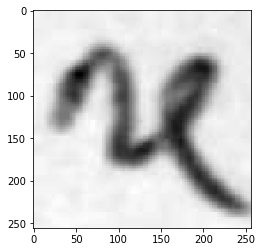

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


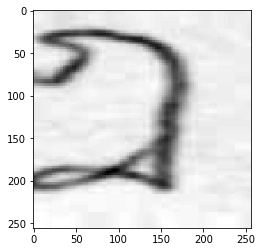

รูปบนนี้ทำนายว่าเป็น ฎ
--------------------------------------------------


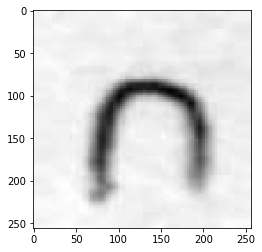

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


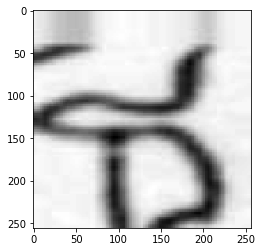

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


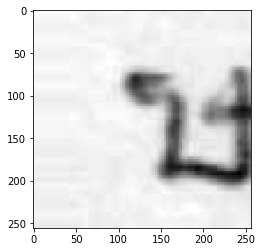

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


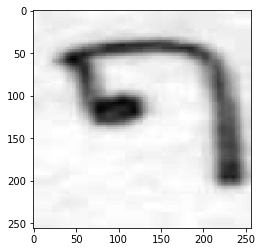

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


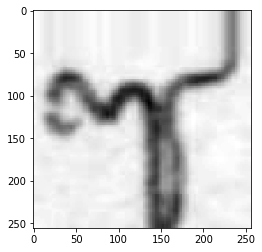

รูปบนนี้ทำนายว่าเป็น ซ
--------------------------------------------------


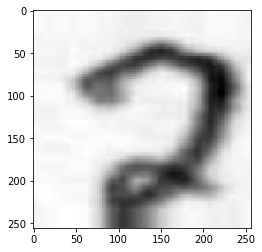

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


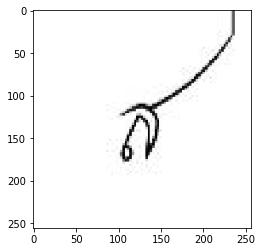

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


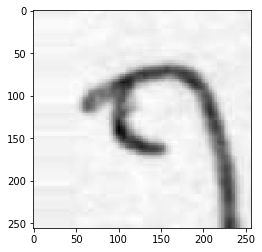

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


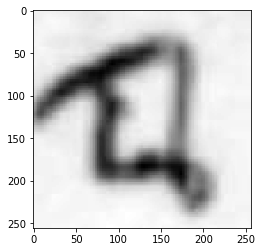

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


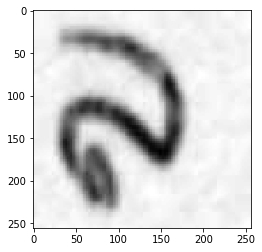

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


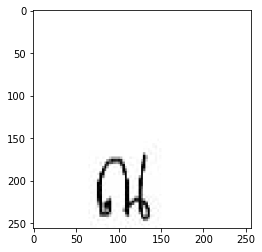

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


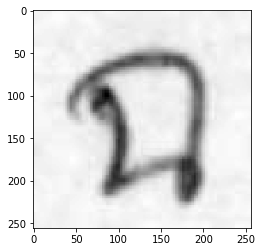

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


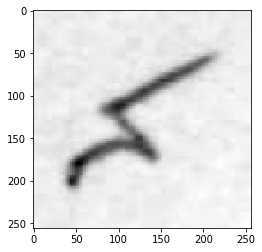

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


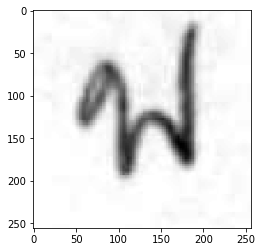

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


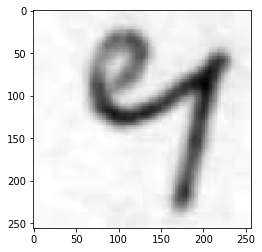

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


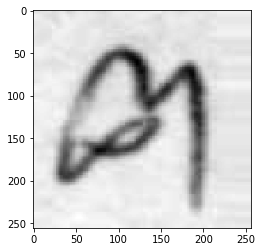

รูปบนนี้ทำนายว่าเป็น ฅ
--------------------------------------------------


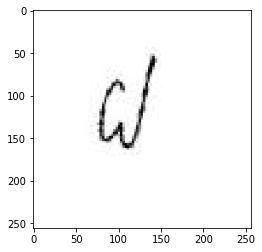

รูปบนนี้ทำนายว่าเป็น ฝ
--------------------------------------------------


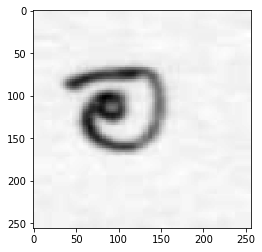

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


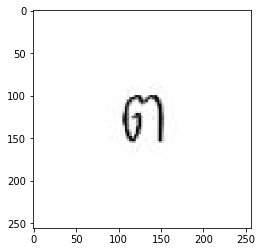

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


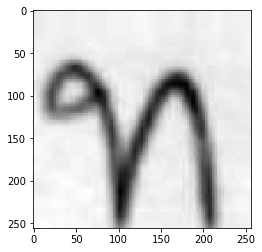

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


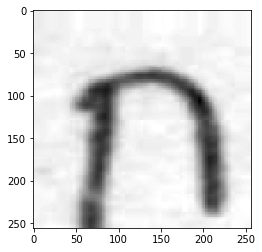

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


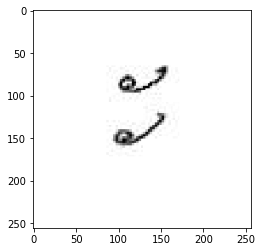

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


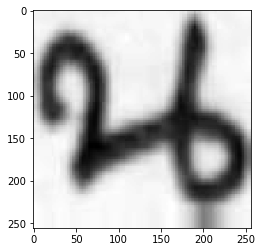

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


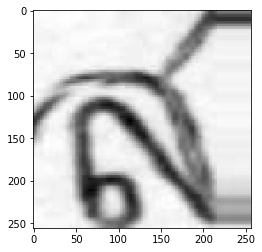

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


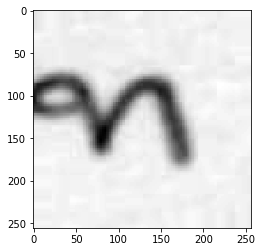

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


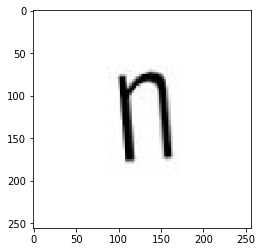

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


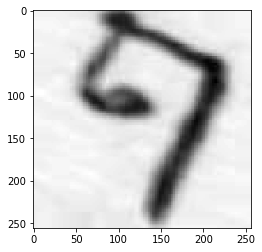

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


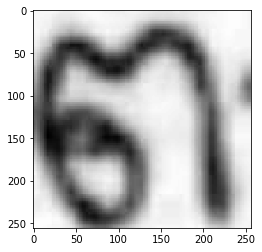

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


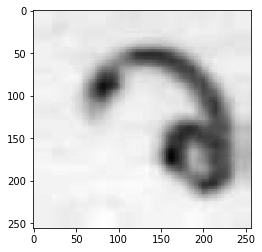

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


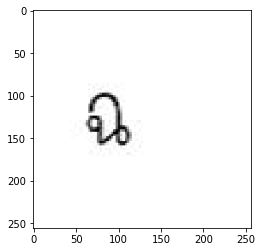

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


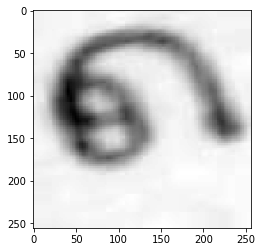

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


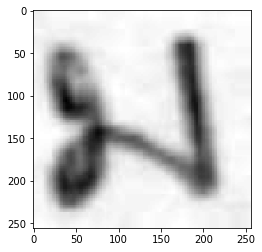

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


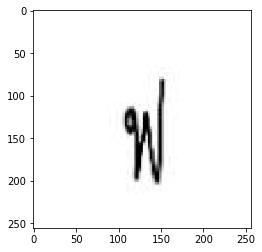

รูปบนนี้ทำนายว่าเป็น ฟ
--------------------------------------------------


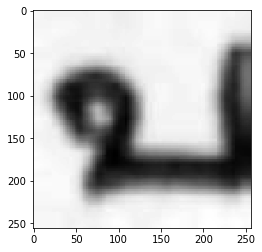

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


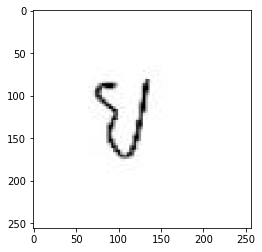

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


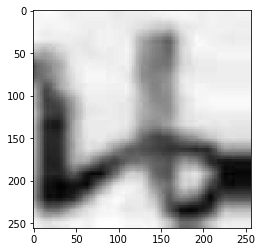

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


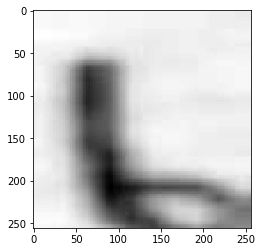

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


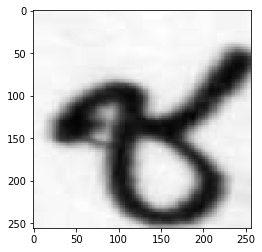

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


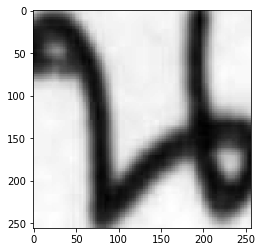

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


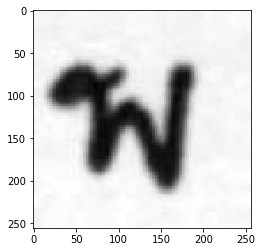

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


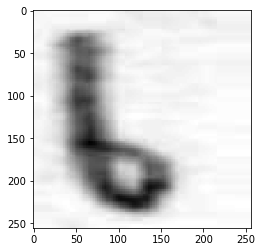

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


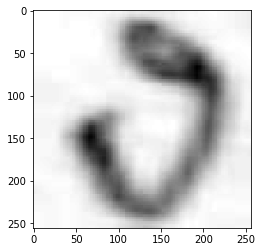

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


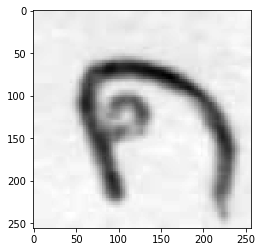

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


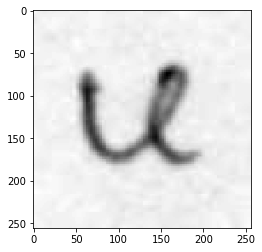

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


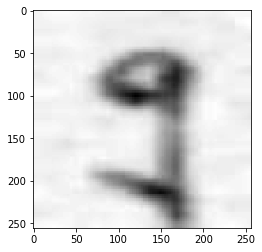

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


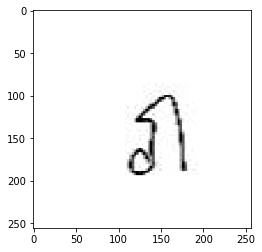

รูปบนนี้ทำนายว่าเป็น ภ
--------------------------------------------------


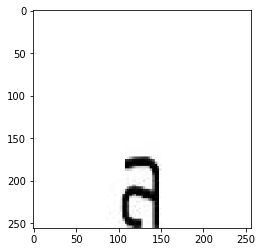

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


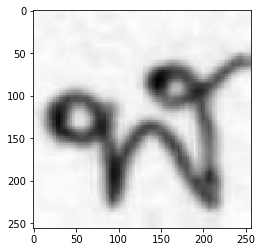

รูปบนนี้ทำนายว่าเป็น ฬ
--------------------------------------------------


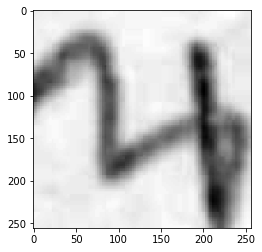

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


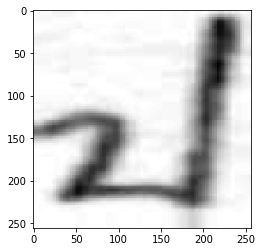

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


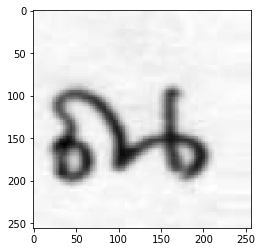

รูปบนนี้ทำนายว่าเป็น ณ
--------------------------------------------------


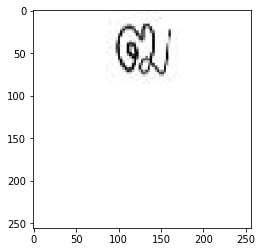

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


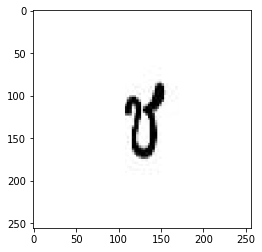

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


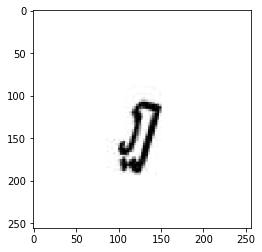

รูปบนนี้ทำนายว่าเป็น ฎ
--------------------------------------------------


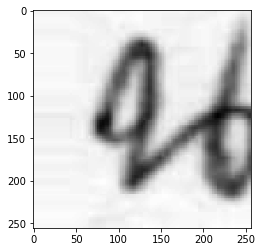

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


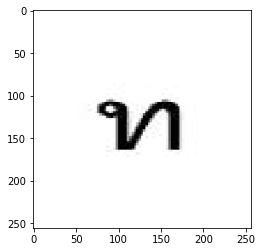

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


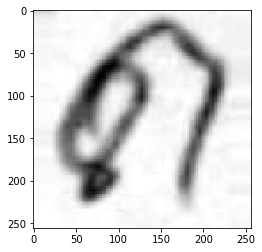

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


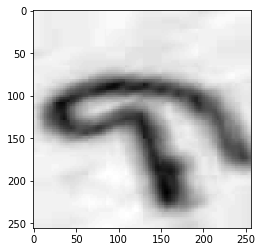

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


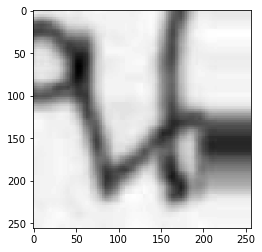

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


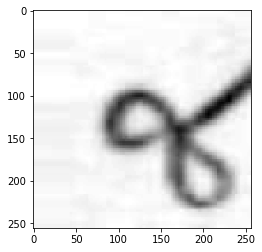

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


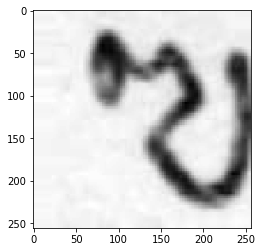

รูปบนนี้ทำนายว่าเป็น โ
--------------------------------------------------


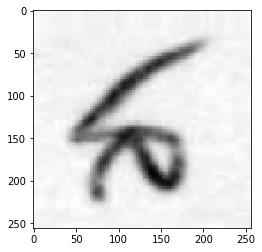

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


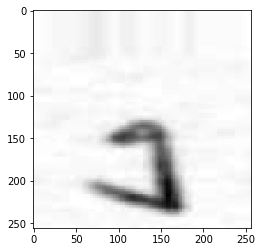

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


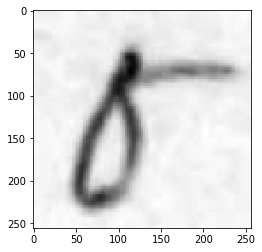

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


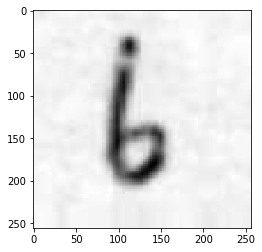

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


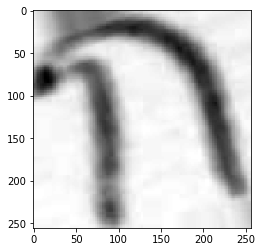

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


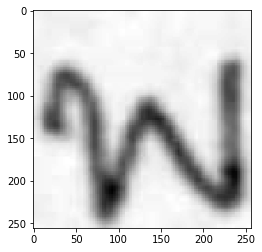

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


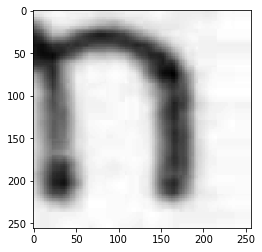

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


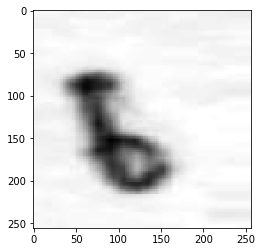

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


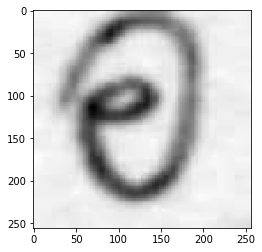

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


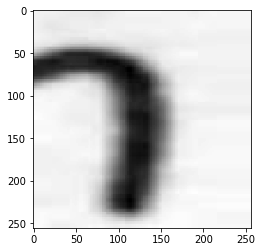

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


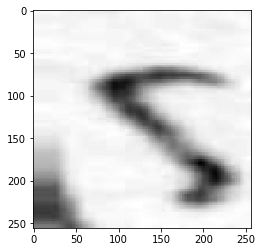

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


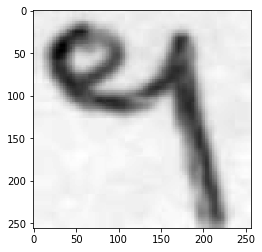

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


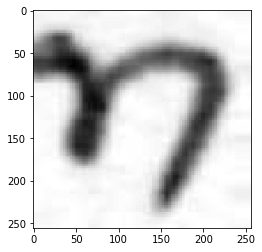

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


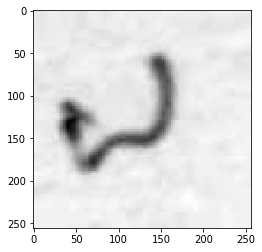

รูปบนนี้ทำนายว่าเป็น ฝ
--------------------------------------------------


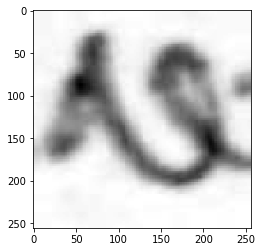

รูปบนนี้ทำนายว่าเป็น ษ
--------------------------------------------------


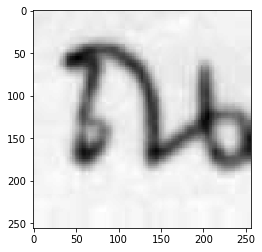

รูปบนนี้ทำนายว่าเป็น ณ
--------------------------------------------------


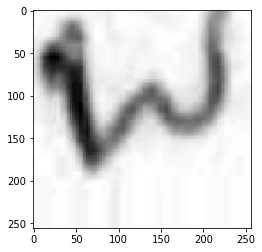

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


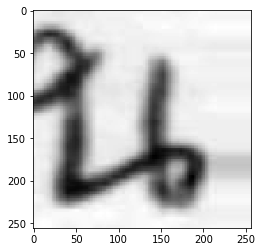

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


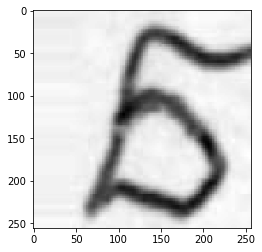

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


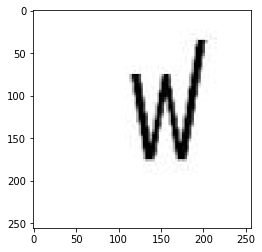

รูปบนนี้ทำนายว่าเป็น ฟ
--------------------------------------------------


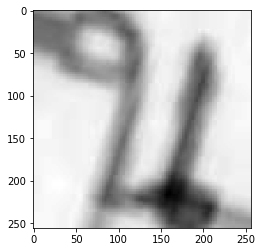

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


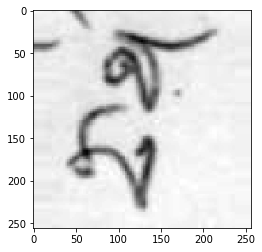

รูปบนนี้ทำนายว่าเป็น ฐ
--------------------------------------------------


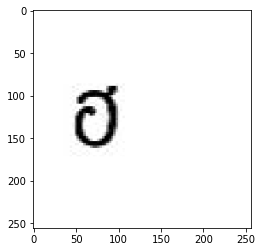

รูปบนนี้ทำนายว่าเป็น า
--------------------------------------------------


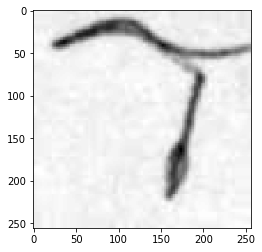

รูปบนนี้ทำนายว่าเป็น ฯ
--------------------------------------------------


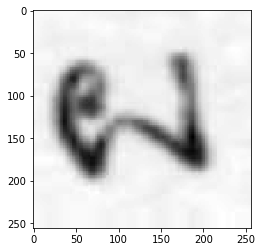

รูปบนนี้ทำนายว่าเป็น ผ
--------------------------------------------------


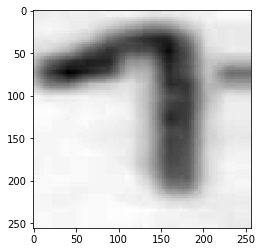

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


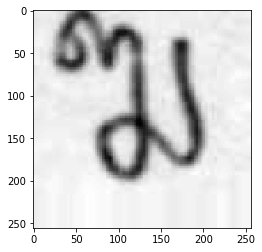

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


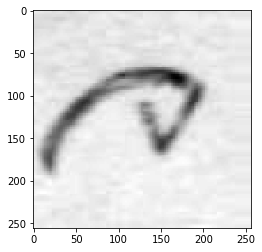

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


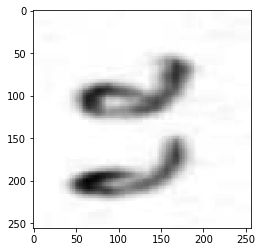

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


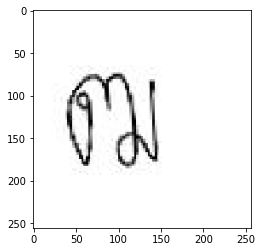

รูปบนนี้ทำนายว่าเป็น ฒ
--------------------------------------------------


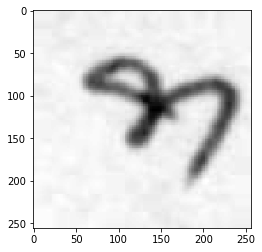

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


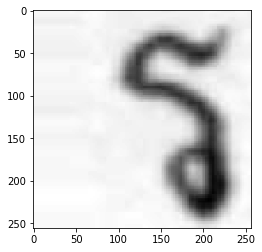

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


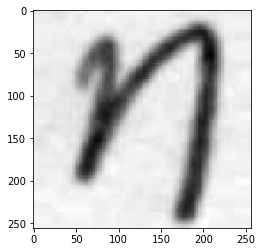

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


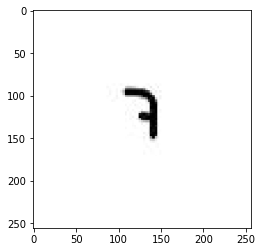

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


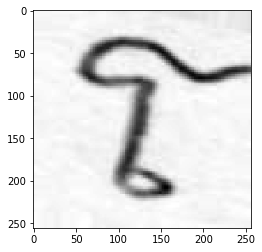

รูปบนนี้ทำนายว่าเป็น ฯ
--------------------------------------------------


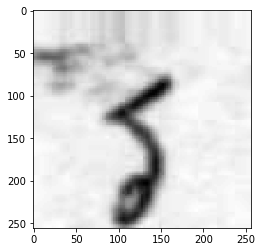

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


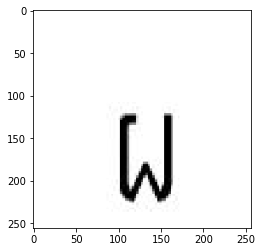

รูปบนนี้ทำนายว่าเป็น ผ
--------------------------------------------------


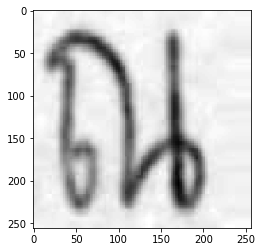

รูปบนนี้ทำนายว่าเป็น ณ
--------------------------------------------------


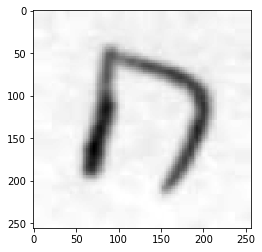

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


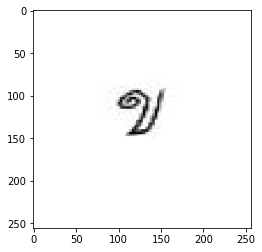

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


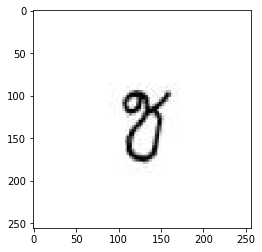

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


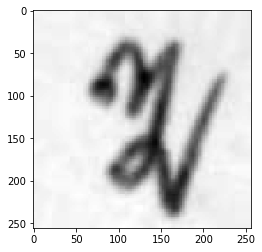

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


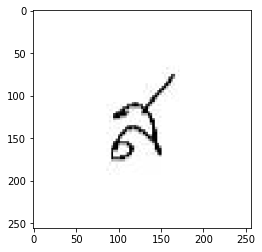

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


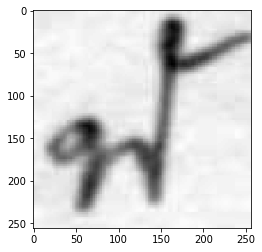

รูปบนนี้ทำนายว่าเป็น ฬ
--------------------------------------------------


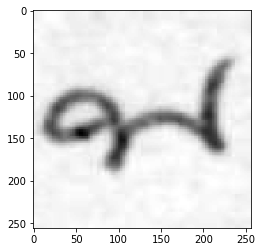

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


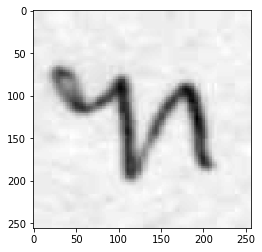

รูปบนนี้ทำนายว่าเป็น ฑ
--------------------------------------------------


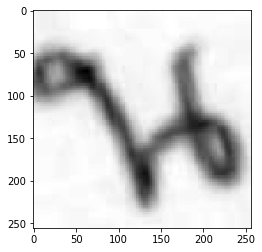

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


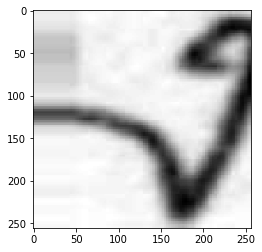

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


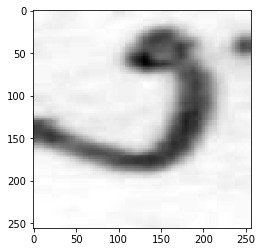

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


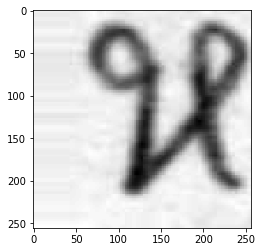

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


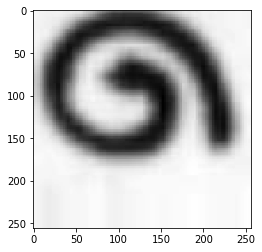

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


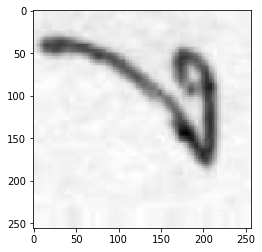

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


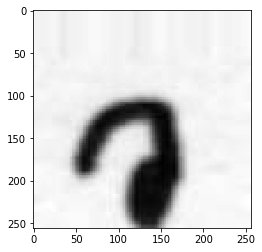

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


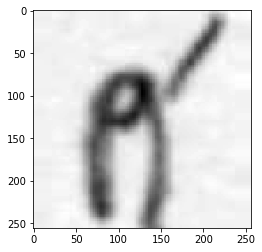

รูปบนนี้ทำนายว่าเป็น ศ
--------------------------------------------------


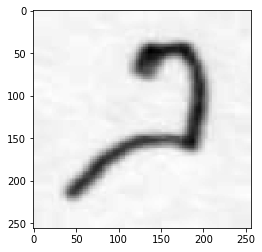

รูปบนนี้ทำนายว่าเป็น โ
--------------------------------------------------


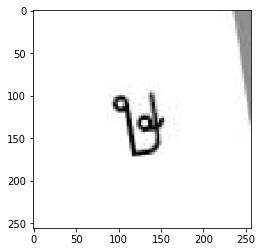

รูปบนนี้ทำนายว่าเป็น ษ
--------------------------------------------------


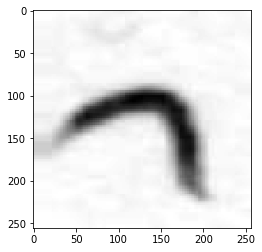

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


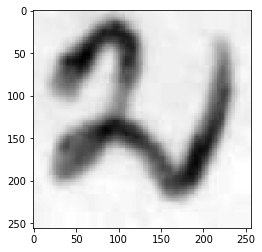

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


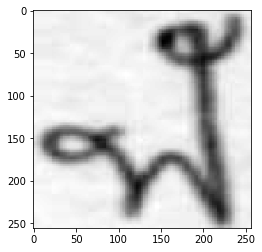

รูปบนนี้ทำนายว่าเป็น ฬ
--------------------------------------------------


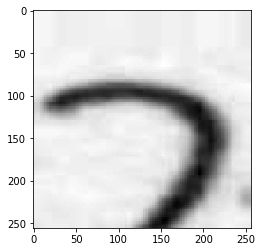

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


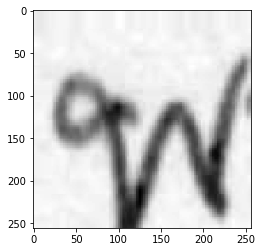

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


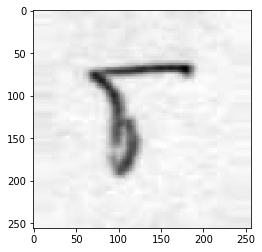

รูปบนนี้ทำนายว่าเป็น ฯ
--------------------------------------------------


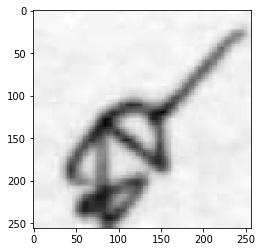

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


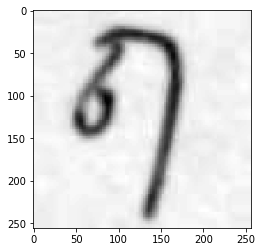

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


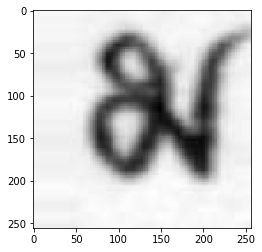

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


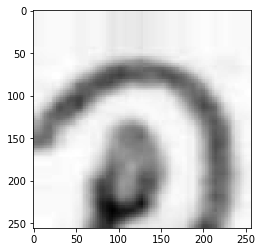

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


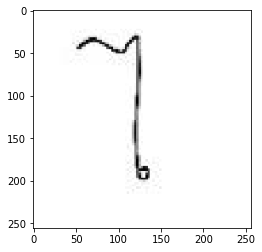

รูปบนนี้ทำนายว่าเป็น แ
--------------------------------------------------


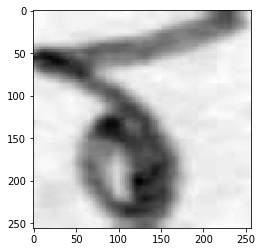

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


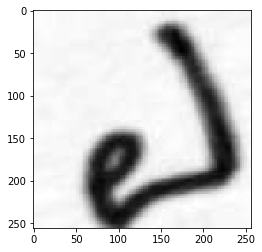

รูปบนนี้ทำนายว่าเป็น ฝ
--------------------------------------------------


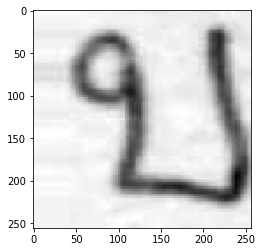

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


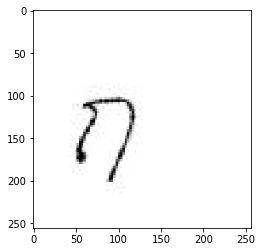

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


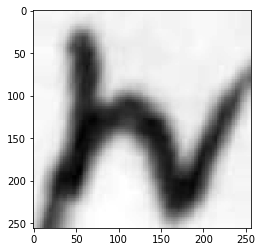

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


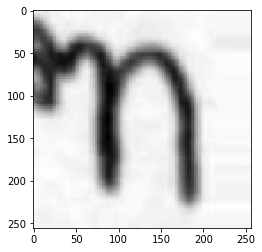

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


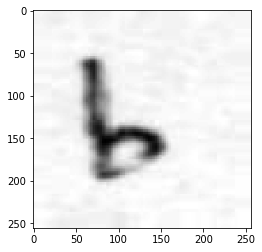

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


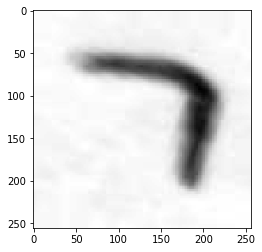

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


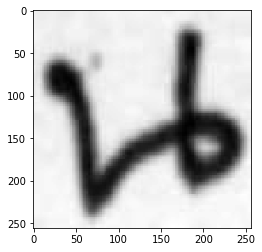

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


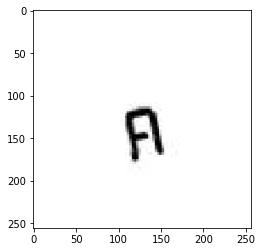

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


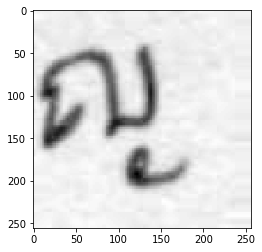

รูปบนนี้ทำนายว่าเป็น ญ
--------------------------------------------------


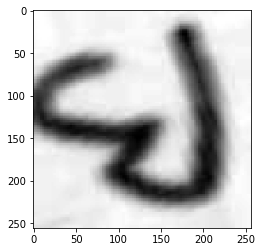

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


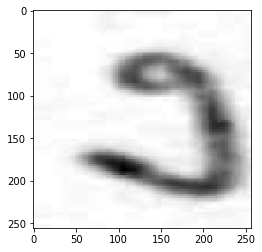

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


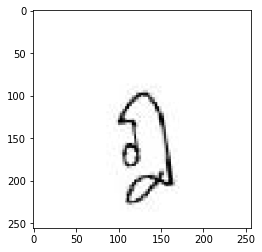

รูปบนนี้ทำนายว่าเป็น ฎ
--------------------------------------------------


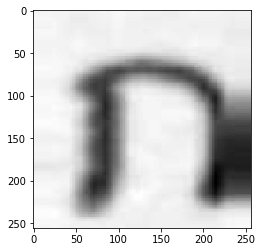

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


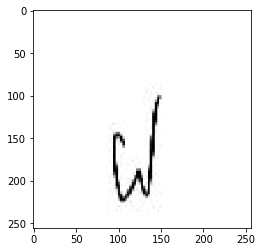

รูปบนนี้ทำนายว่าเป็น ฝ
--------------------------------------------------


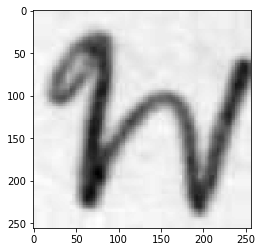

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


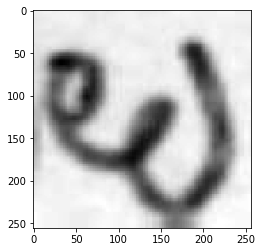

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


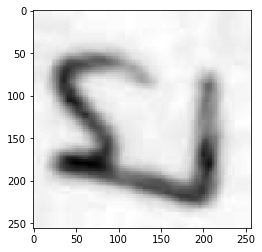

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


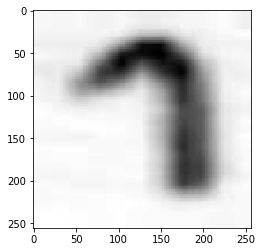

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


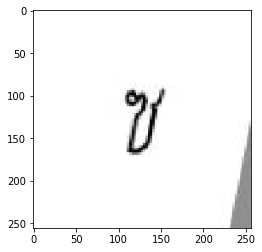

รูปบนนี้ทำนายว่าเป็น ซ
--------------------------------------------------


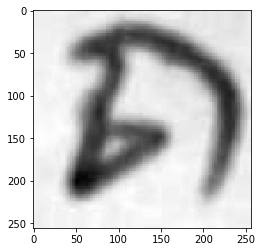

รูปบนนี้ทำนายว่าเป็น ถ
--------------------------------------------------


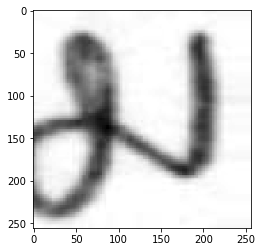

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


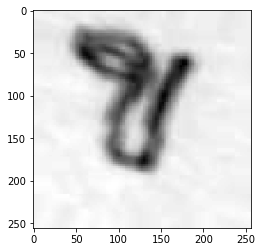

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


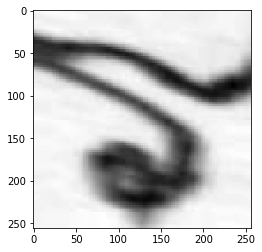

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


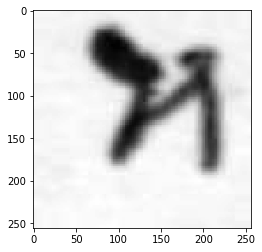

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


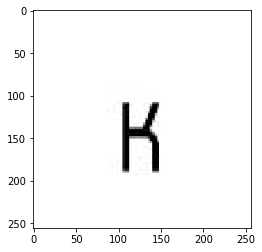

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


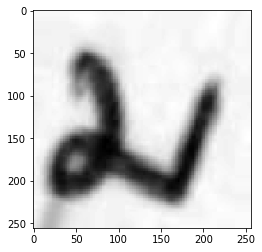

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


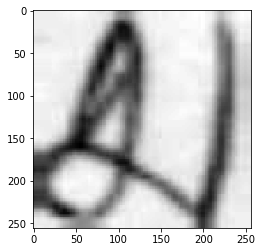

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


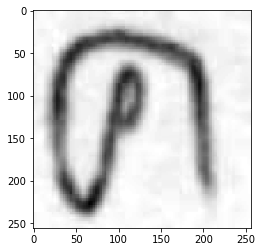

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


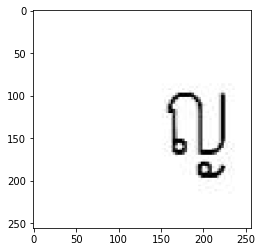

รูปบนนี้ทำนายว่าเป็น ญ
--------------------------------------------------


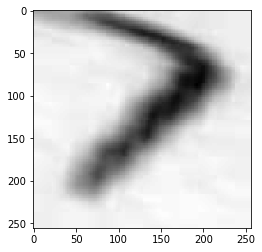

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


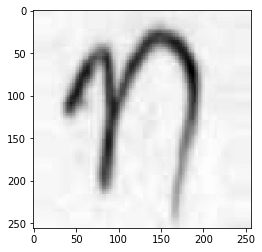

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


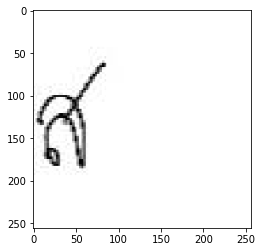

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


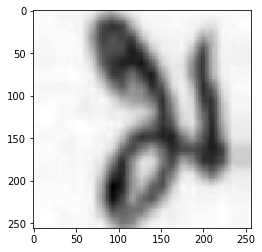

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


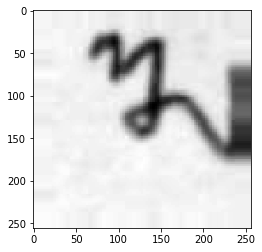

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


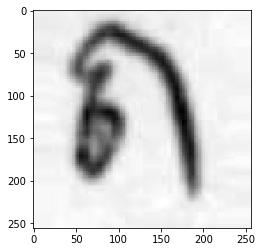

รูปบนนี้ทำนายว่าเป็น ถ
--------------------------------------------------


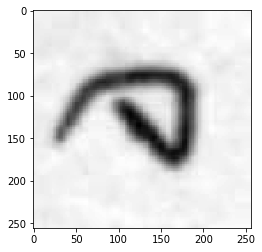

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


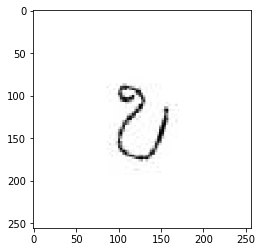

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


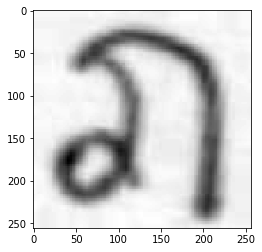

รูปบนนี้ทำนายว่าเป็น ภ
--------------------------------------------------


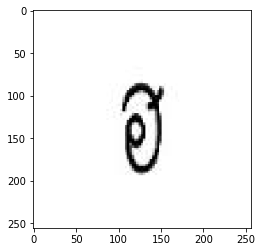

รูปบนนี้ทำนายว่าเป็น า
--------------------------------------------------


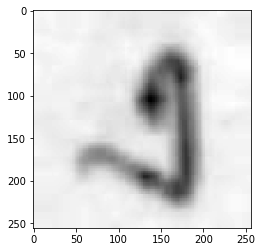

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


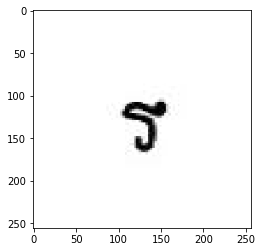

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


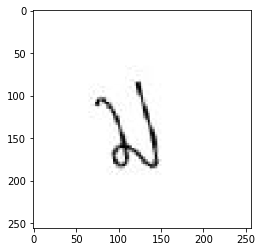

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


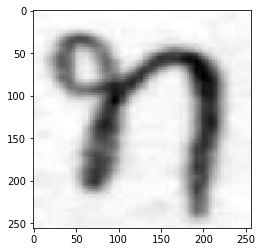

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


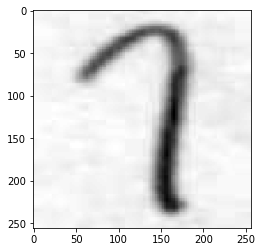

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


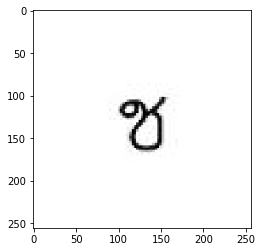

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


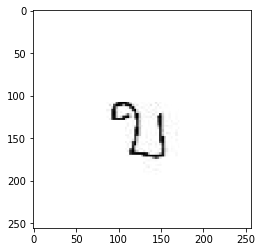

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


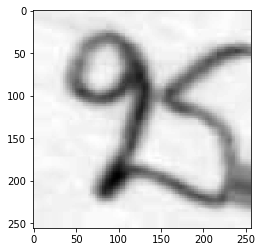

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


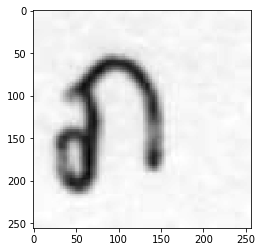

รูปบนนี้ทำนายว่าเป็น ภ
--------------------------------------------------


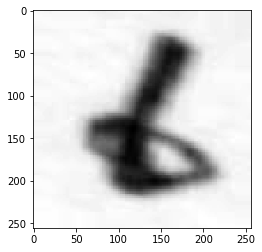

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


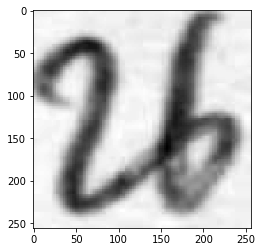

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


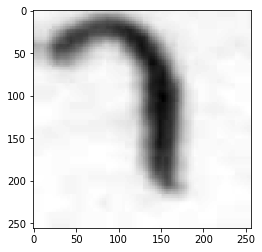

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


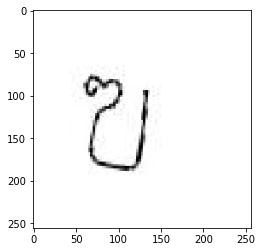

รูปบนนี้ทำนายว่าเป็น ฃ
--------------------------------------------------


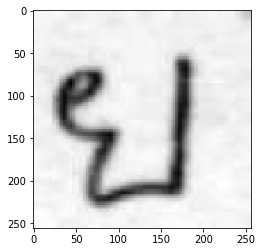

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


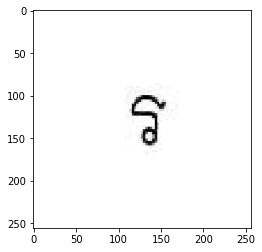

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


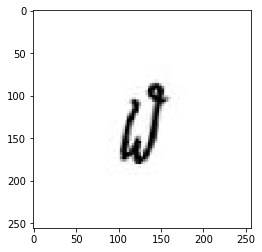

รูปบนนี้ทำนายว่าเป็น ฬ
--------------------------------------------------


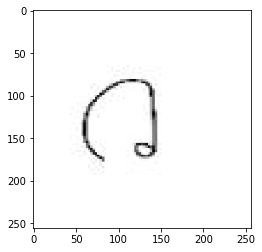

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


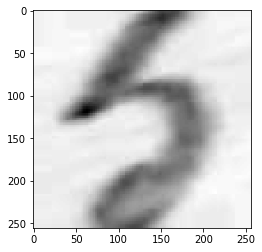

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


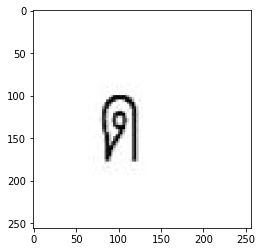

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


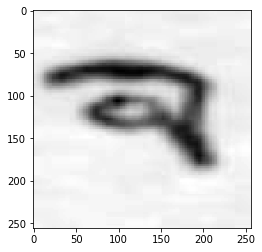

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


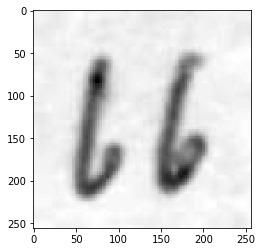

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


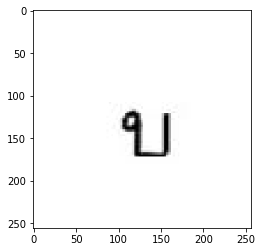

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


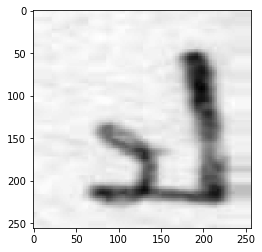

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


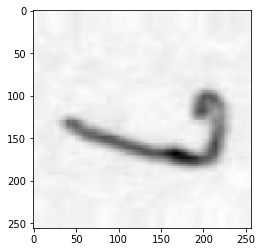

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


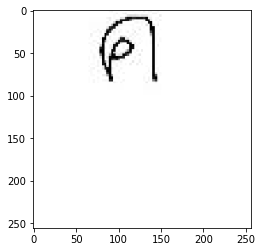

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


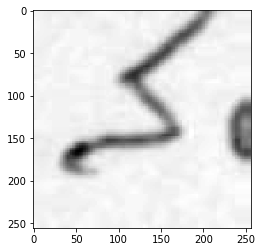

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


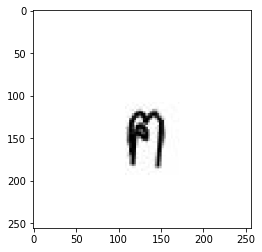

รูปบนนี้ทำนายว่าเป็น ฅ
--------------------------------------------------


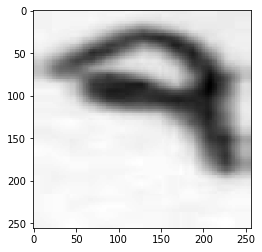

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


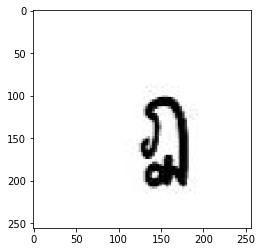

รูปบนนี้ทำนายว่าเป็น ฏ
--------------------------------------------------


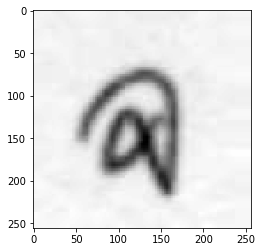

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


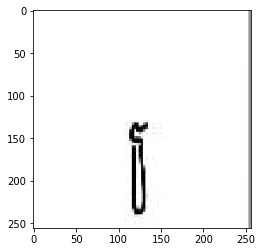

รูปบนนี้ทำนายว่าเป็น ธ
--------------------------------------------------


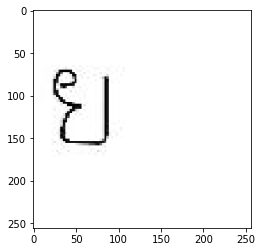

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


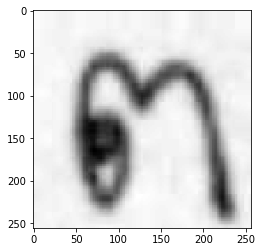

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


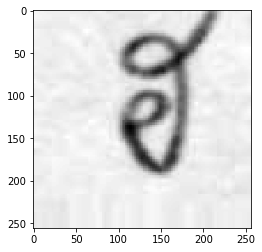

รูปบนนี้ทำนายว่าเป็น า
--------------------------------------------------


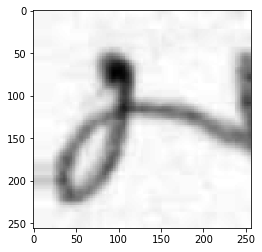

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


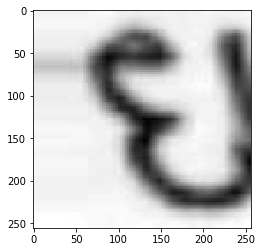

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


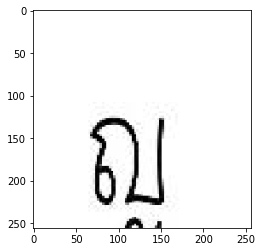

รูปบนนี้ทำนายว่าเป็น ญ
--------------------------------------------------


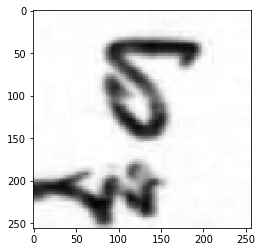

รูปบนนี้ทำนายว่าเป็น ฐ
--------------------------------------------------


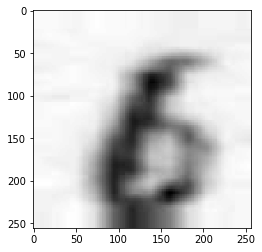

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


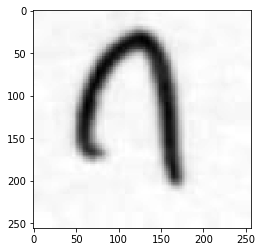

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


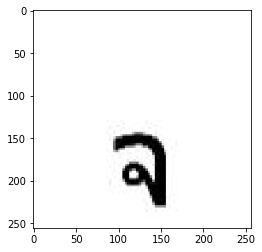

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


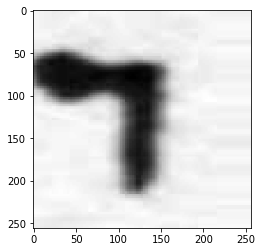

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


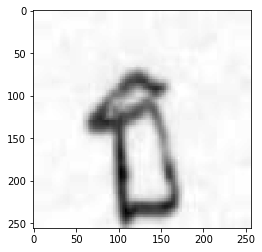

รูปบนนี้ทำนายว่าเป็น ธ
--------------------------------------------------


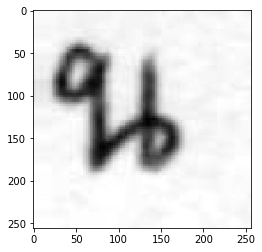

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


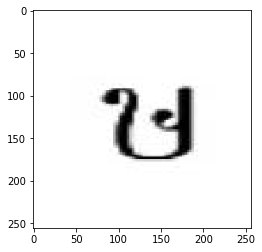

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


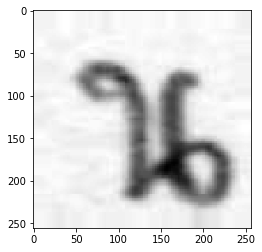

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


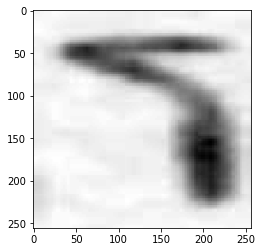

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


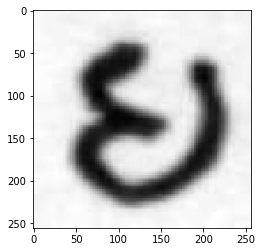

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


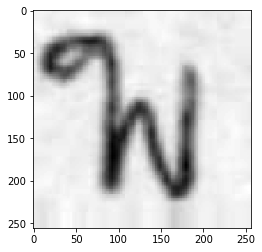

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


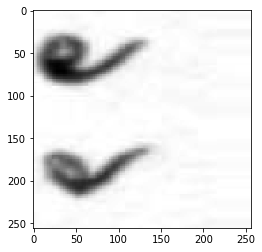

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


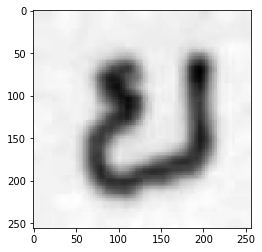

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


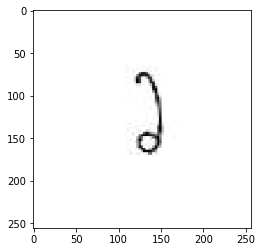

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


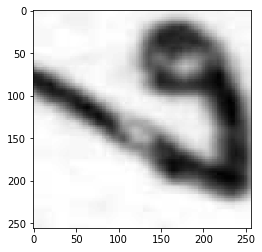

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


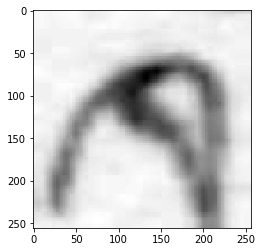

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


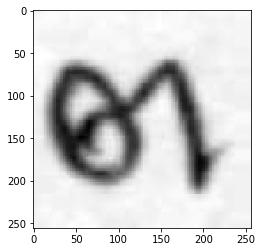

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


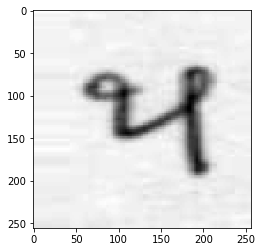

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


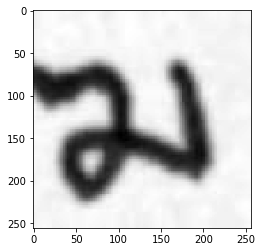

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


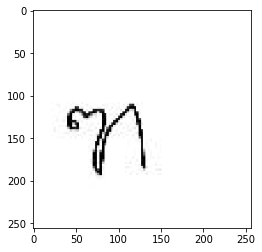

รูปบนนี้ทำนายว่าเป็น ฑ
--------------------------------------------------


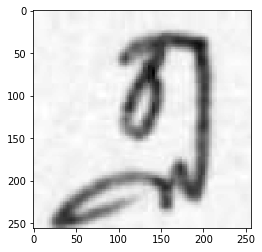

รูปบนนี้ทำนายว่าเป็น ฏ
--------------------------------------------------


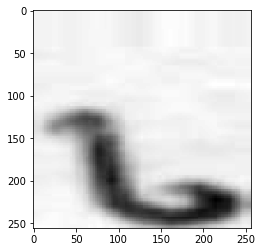

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


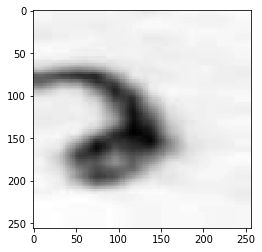

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


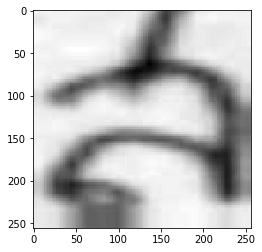

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


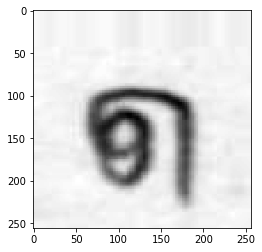

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


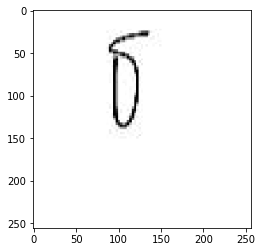

รูปบนนี้ทำนายว่าเป็น ธ
--------------------------------------------------


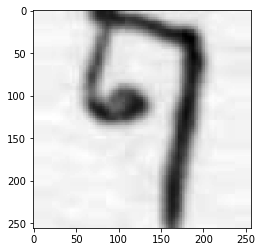

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


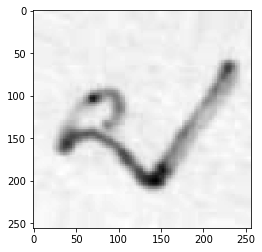

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


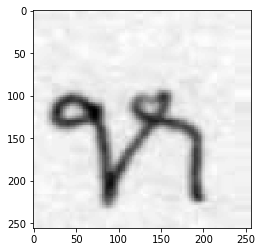

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


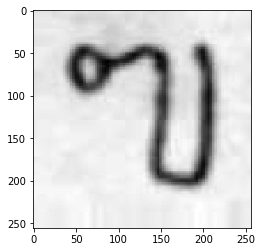

รูปบนนี้ทำนายว่าเป็น ฃ
--------------------------------------------------


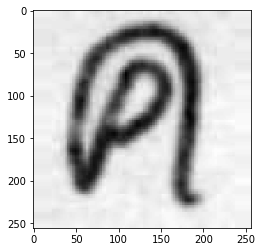

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


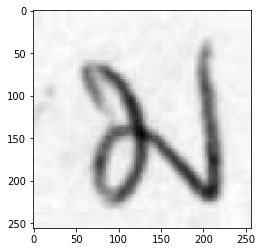

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


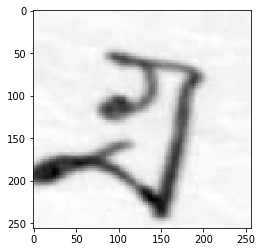

รูปบนนี้ทำนายว่าเป็น ฎ
--------------------------------------------------


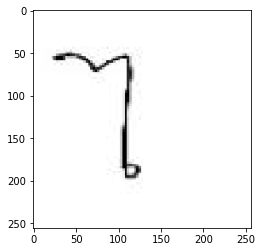

รูปบนนี้ทำนายว่าเป็น แ
--------------------------------------------------


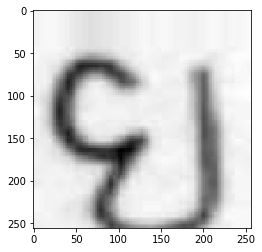

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


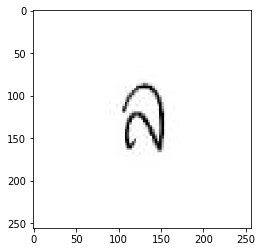

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


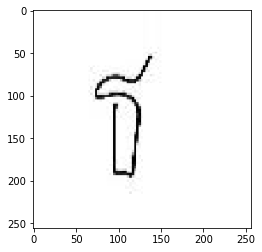

รูปบนนี้ทำนายว่าเป็น ธ
--------------------------------------------------


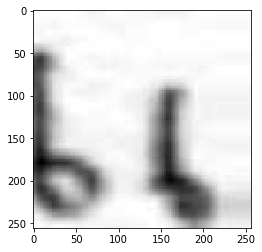

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


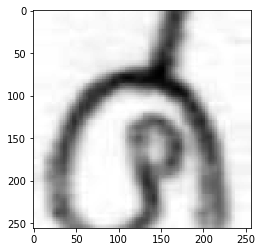

รูปบนนี้ทำนายว่าเป็น ศ
--------------------------------------------------


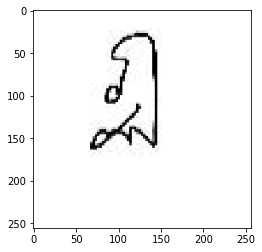

รูปบนนี้ทำนายว่าเป็น ฏ
--------------------------------------------------


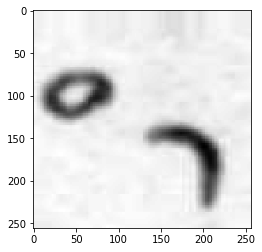

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


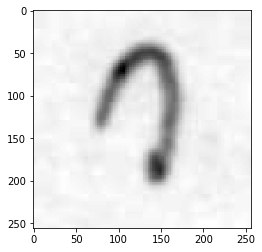

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


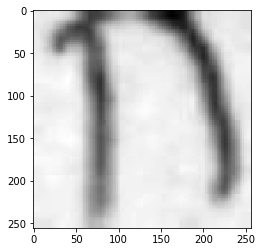

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


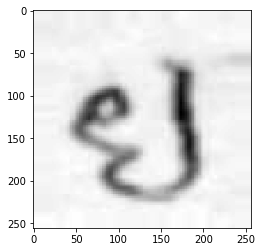

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


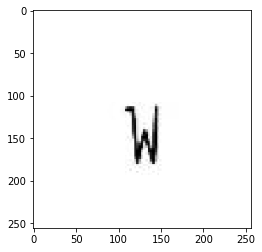

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


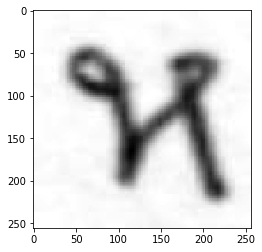

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


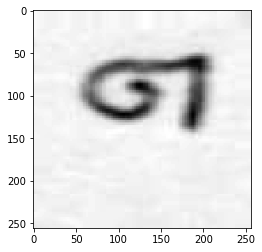

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


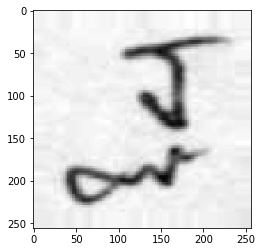

รูปบนนี้ทำนายว่าเป็น ฐ
--------------------------------------------------


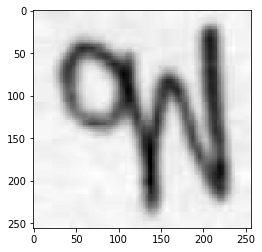

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


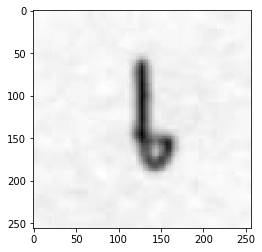

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


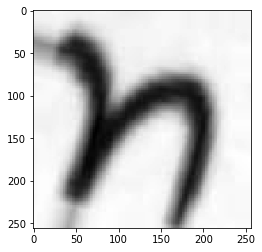

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


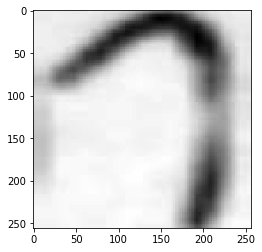

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


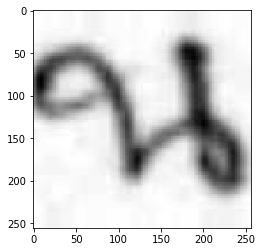

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


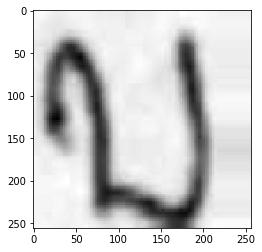

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


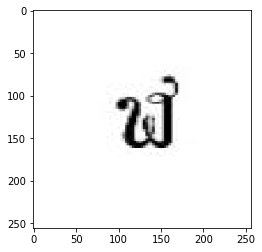

รูปบนนี้ทำนายว่าเป็น ฬ
--------------------------------------------------


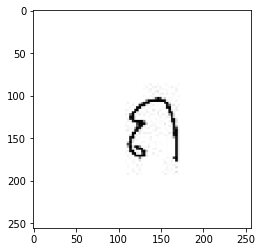

รูปบนนี้ทำนายว่าเป็น ถ
--------------------------------------------------


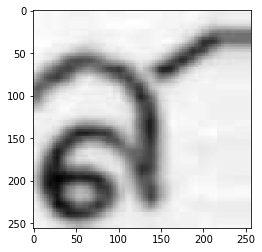

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


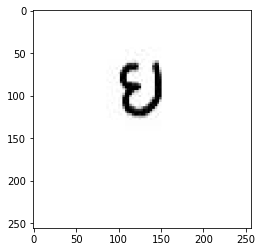

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


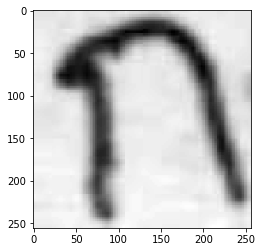

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


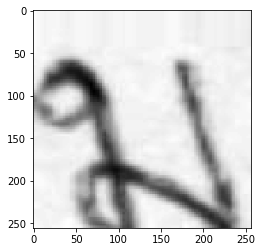

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


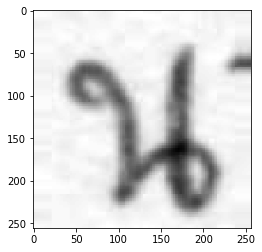

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


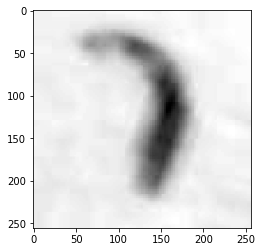

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


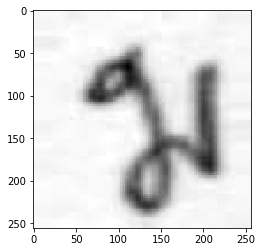

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


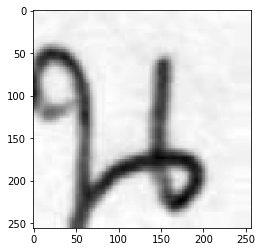

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


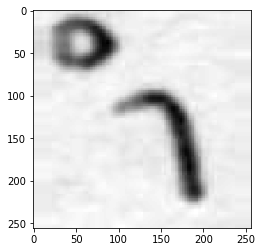

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


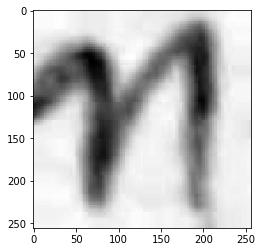

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


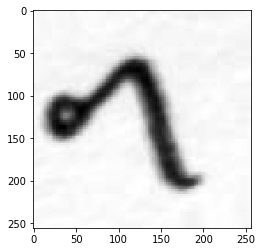

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


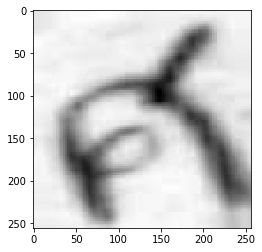

รูปบนนี้ทำนายว่าเป็น ศ
--------------------------------------------------


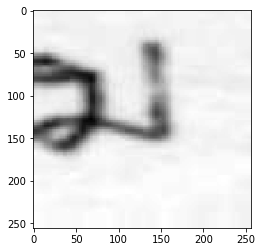

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


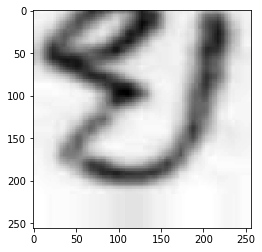

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


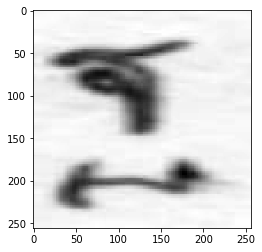

รูปบนนี้ทำนายว่าเป็น ฐ
--------------------------------------------------


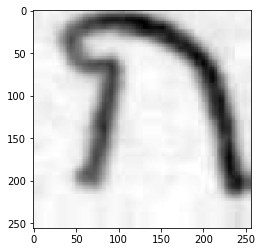

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


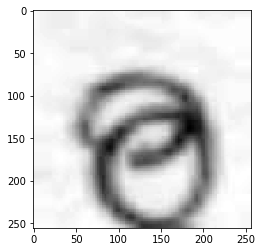

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


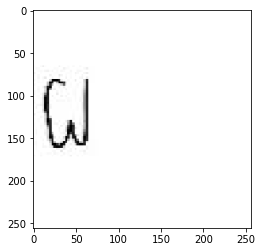

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


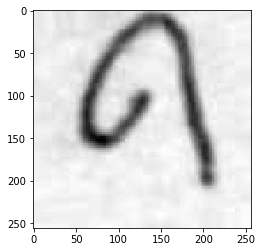

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


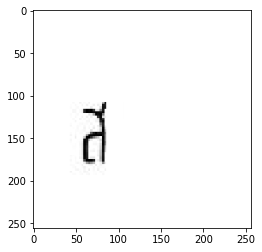

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


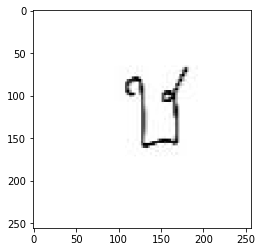

รูปบนนี้ทำนายว่าเป็น ษ
--------------------------------------------------


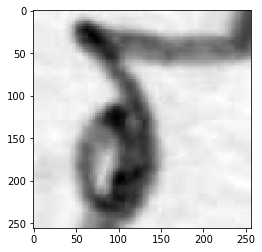

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


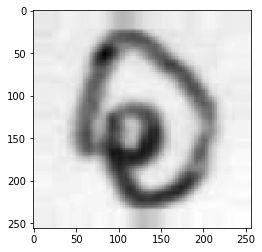

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


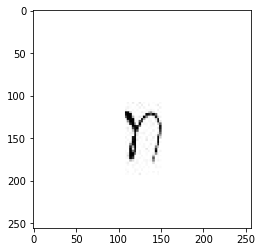

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


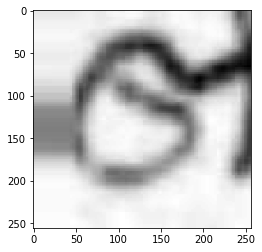

รูปบนนี้ทำนายว่าเป็น ธ
--------------------------------------------------


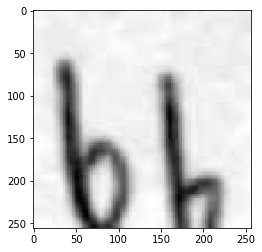

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


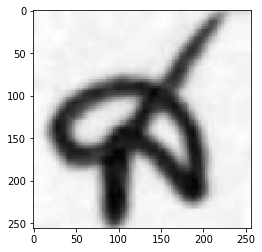

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


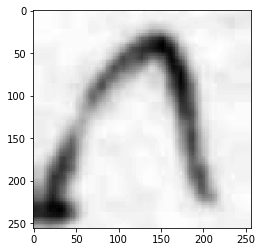

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


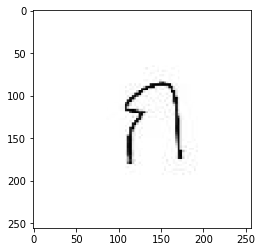

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


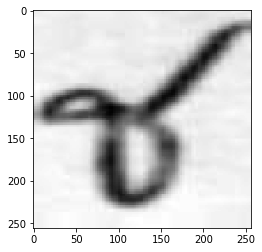

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


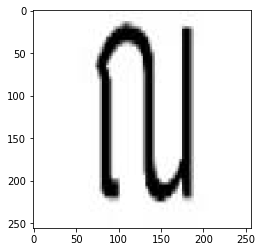

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


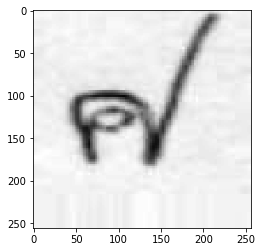

รูปบนนี้ทำนายว่าเป็น ศ
--------------------------------------------------


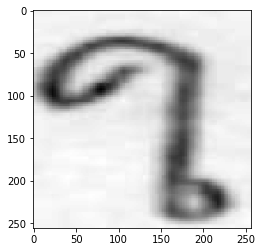

รูปบนนี้ทำนายว่าเป็น เ
--------------------------------------------------


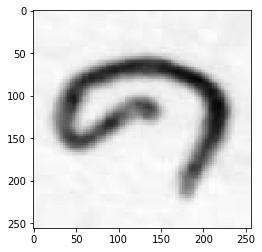

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


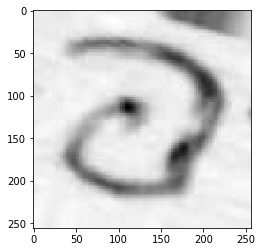

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


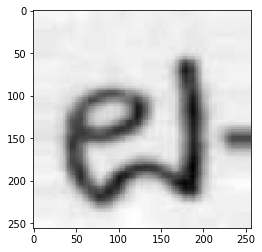

รูปบนนี้ทำนายว่าเป็น ฝ
--------------------------------------------------


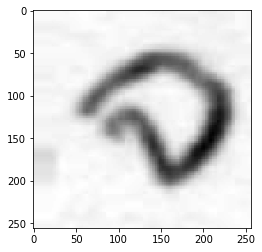

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


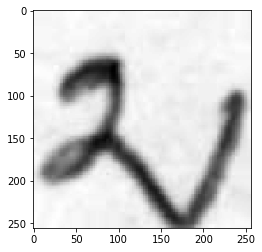

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


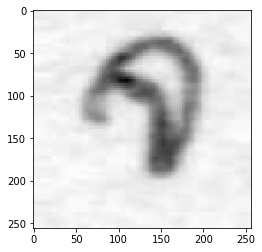

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


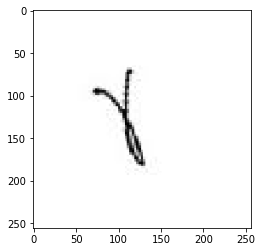

รูปบนนี้ทำนายว่าเป็น แ
--------------------------------------------------


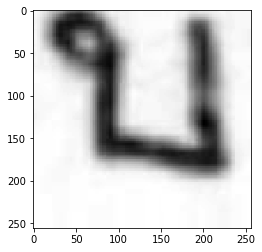

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


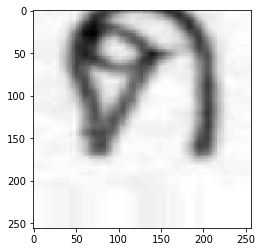

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


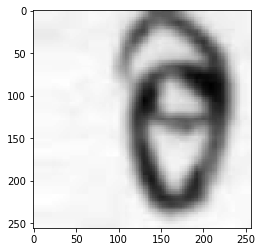

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


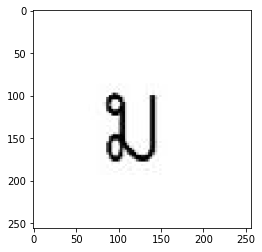

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


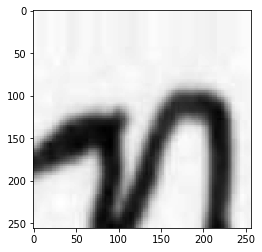

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


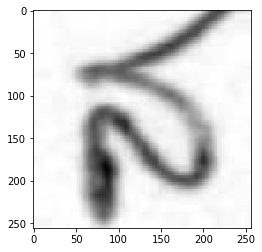

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


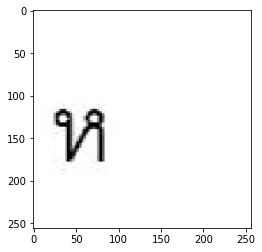

รูปบนนี้ทำนายว่าเป็น ฅ
--------------------------------------------------


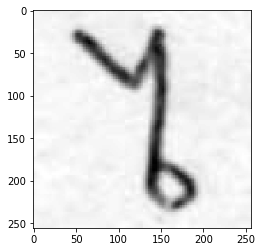

รูปบนนี้ทำนายว่าเป็น แ
--------------------------------------------------


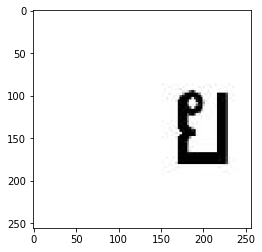

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


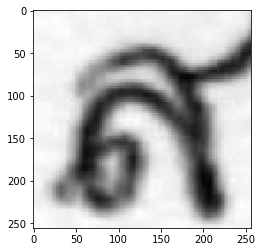

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


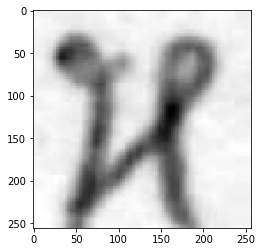

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


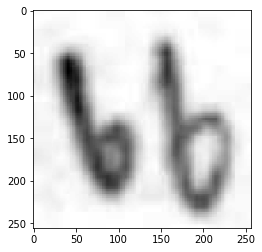

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


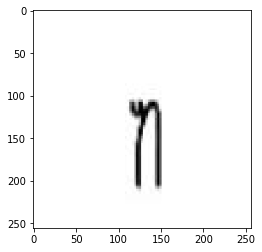

รูปบนนี้ทำนายว่าเป็น ฑ
--------------------------------------------------


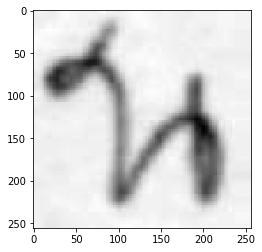

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


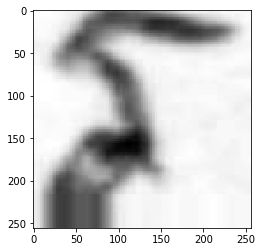

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


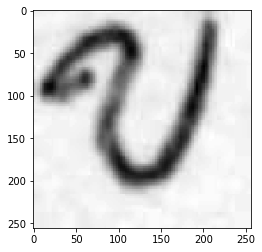

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


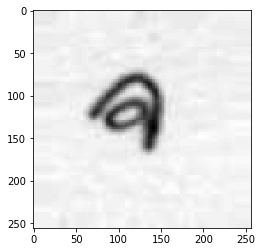

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


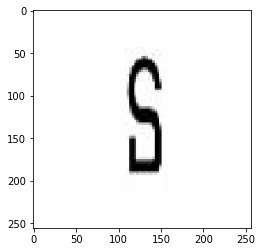

รูปบนนี้ทำนายว่าเป็น ธ
--------------------------------------------------


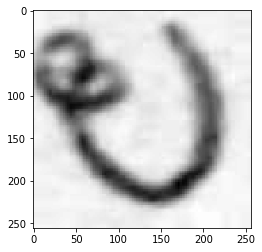

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


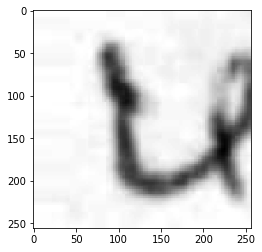

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


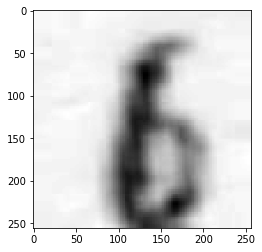

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


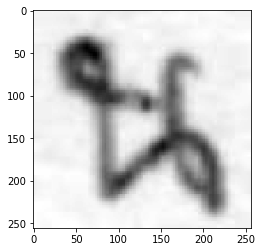

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


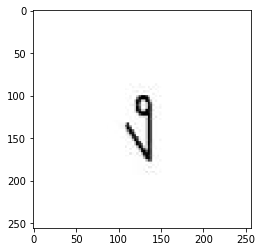

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


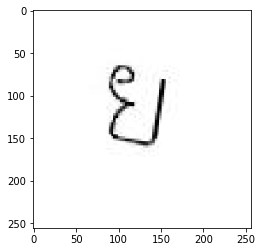

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


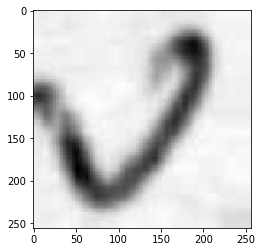

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


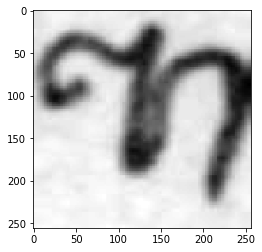

รูปบนนี้ทำนายว่าเป็น ฑ
--------------------------------------------------


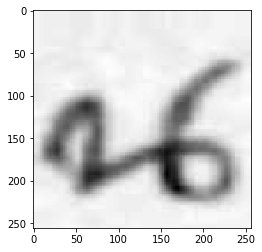

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


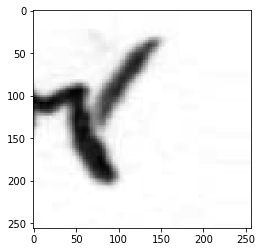

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


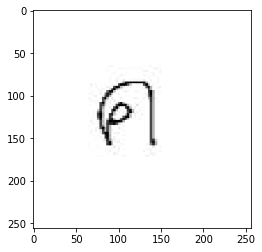

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


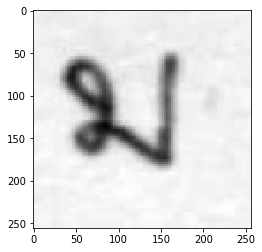

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


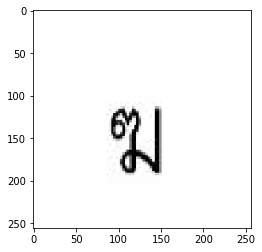

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


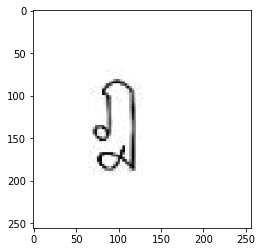

รูปบนนี้ทำนายว่าเป็น ฎ
--------------------------------------------------


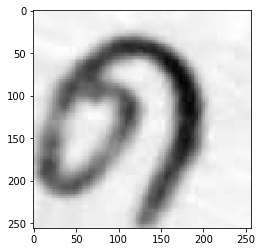

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


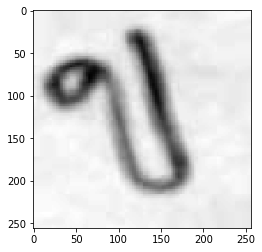

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


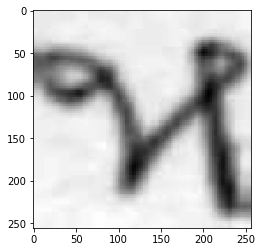

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


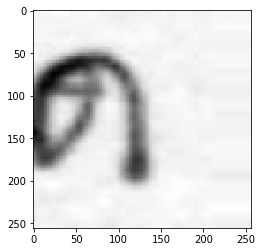

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


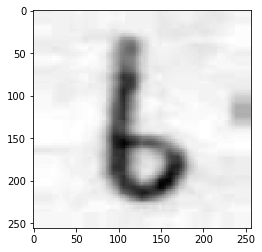

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


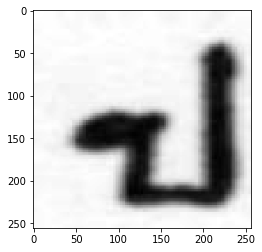

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


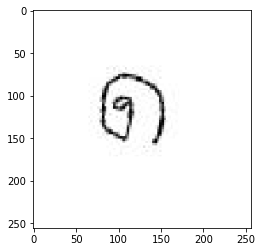

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


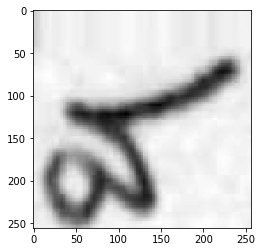

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


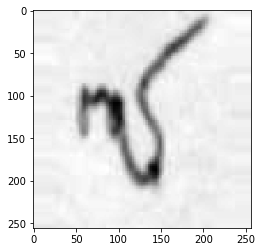

รูปบนนี้ทำนายว่าเป็น ซ
--------------------------------------------------


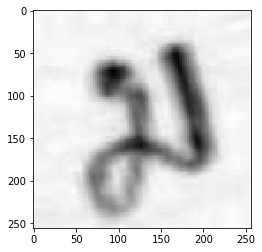

รูปบนนี้ทำนายว่าเป็น ม
--------------------------------------------------


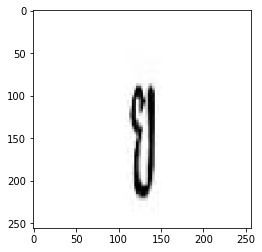

รูปบนนี้ทำนายว่าเป็น ย
--------------------------------------------------


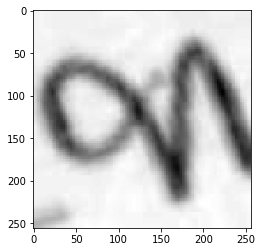

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


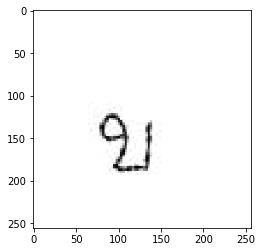

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


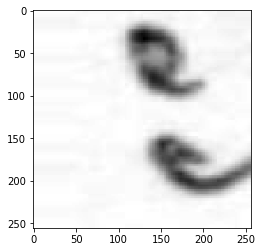

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


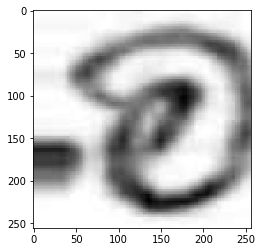

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


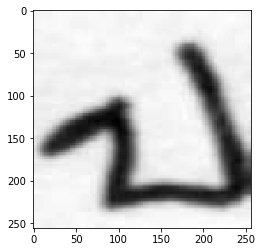

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


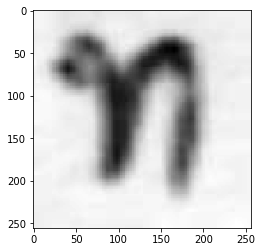

รูปบนนี้ทำนายว่าเป็น ท
--------------------------------------------------


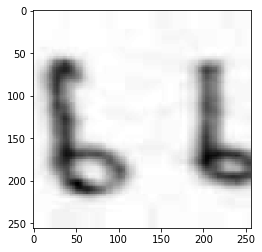

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


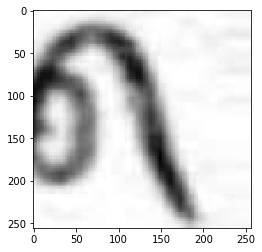

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


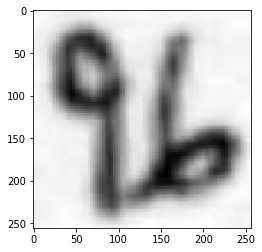

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


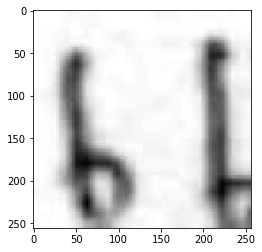

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


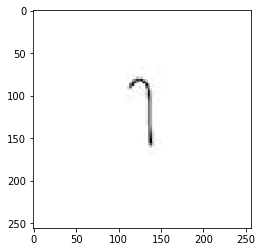

รูปบนนี้ทำนายว่าเป็น ะ
--------------------------------------------------


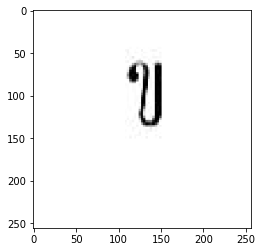

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


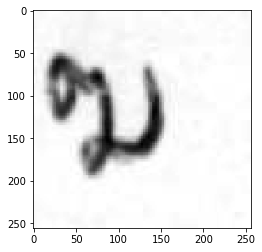

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


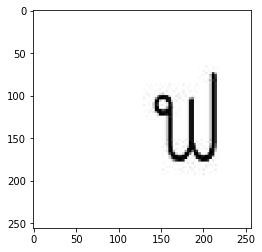

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


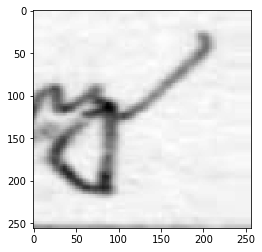

รูปบนนี้ทำนายว่าเป็น ซ
--------------------------------------------------


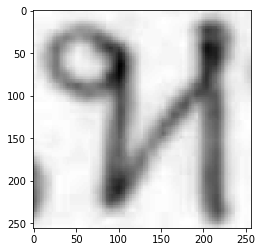

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


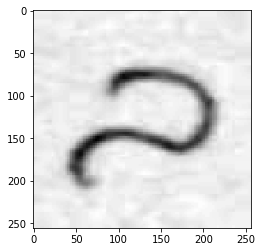

รูปบนนี้ทำนายว่าเป็น ล
--------------------------------------------------


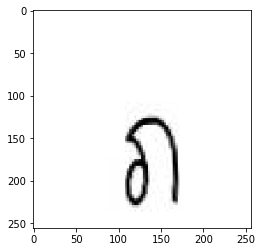

รูปบนนี้ทำนายว่าเป็น ภ
--------------------------------------------------


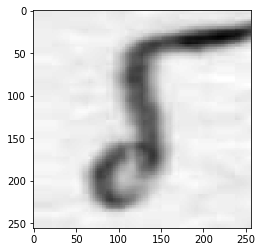

รูปบนนี้ทำนายว่าเป็น ร
--------------------------------------------------


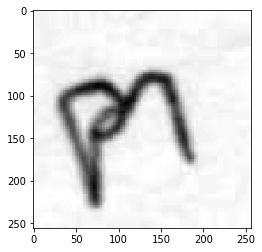

รูปบนนี้ทำนายว่าเป็น ฅ
--------------------------------------------------


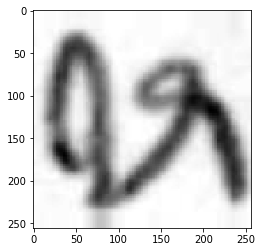

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


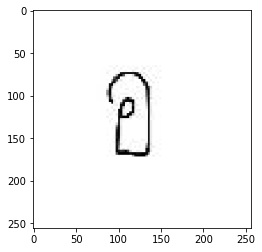

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


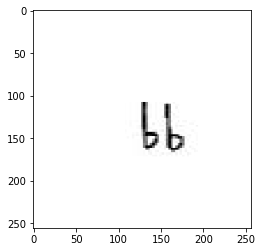

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


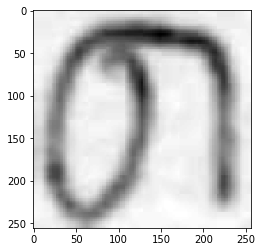

รูปบนนี้ทำนายว่าเป็น ด
--------------------------------------------------


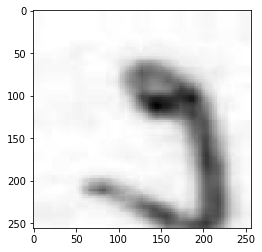

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


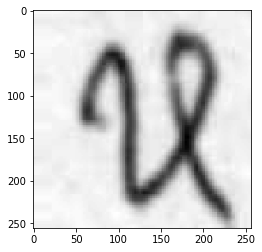

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


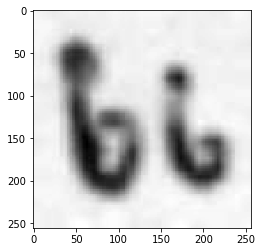

รูปบนนี้ทำนายว่าเป็น ฮ
--------------------------------------------------


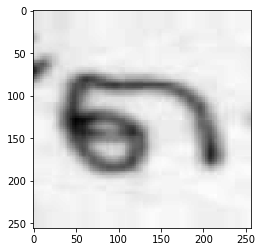

รูปบนนี้ทำนายว่าเป็น ต
--------------------------------------------------


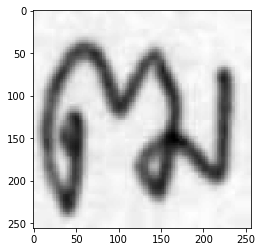

รูปบนนี้ทำนายว่าเป็น ฒ
--------------------------------------------------


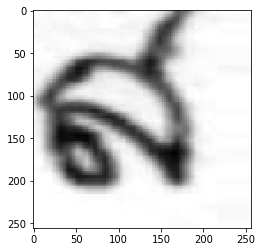

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


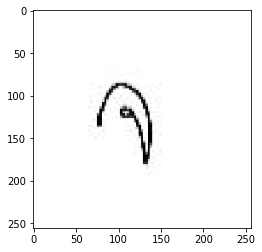

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


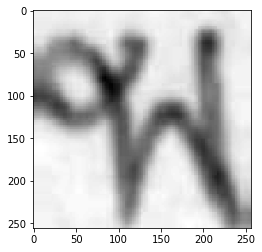

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


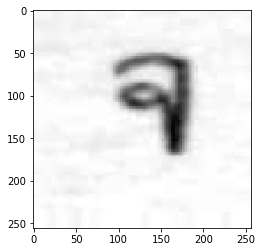

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


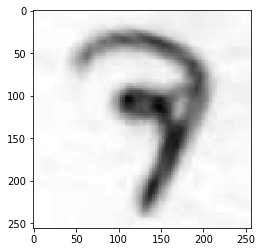

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


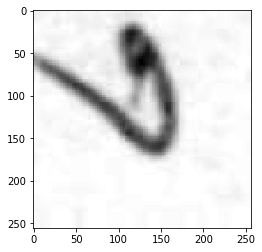

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


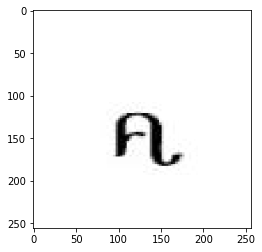

รูปบนนี้ทำนายว่าเป็น ค
--------------------------------------------------


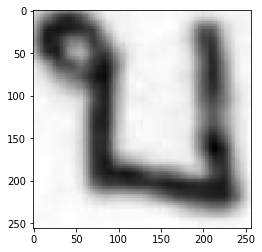

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


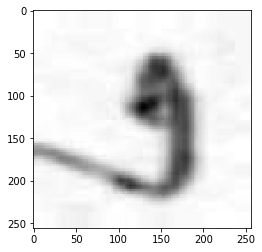

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


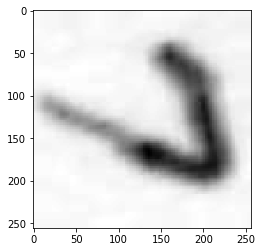

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


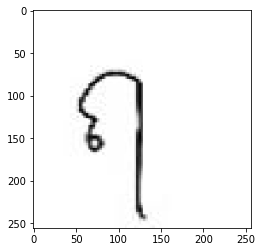

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


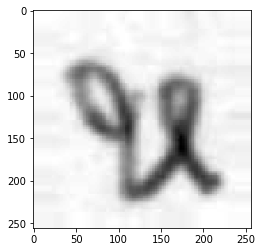

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


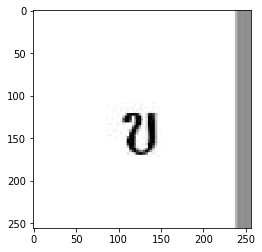

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------


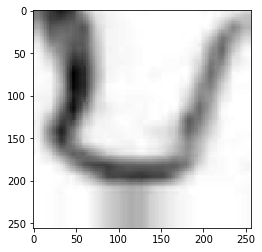

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------


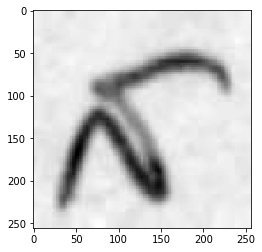

รูปบนนี้ทำนายว่าเป็น ส
--------------------------------------------------


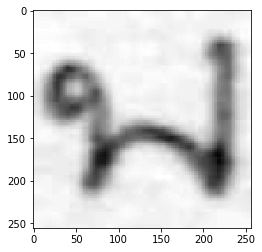

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


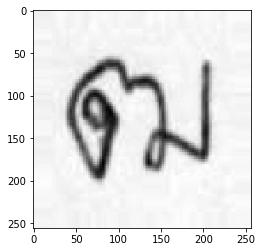

รูปบนนี้ทำนายว่าเป็น ฒ
--------------------------------------------------


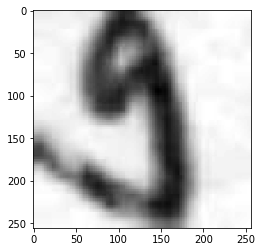

รูปบนนี้ทำนายว่าเป็น ง
--------------------------------------------------


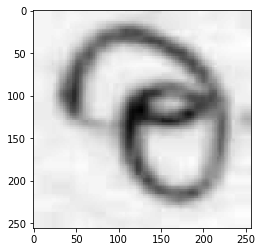

รูปบนนี้ทำนายว่าเป็น อ
--------------------------------------------------


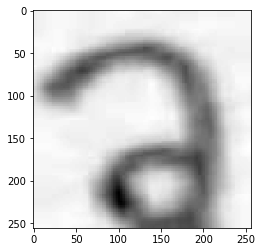

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------


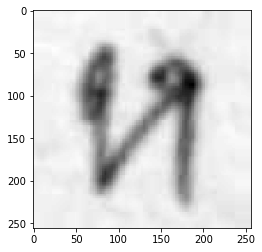

รูปบนนี้ทำนายว่าเป็น ห
--------------------------------------------------


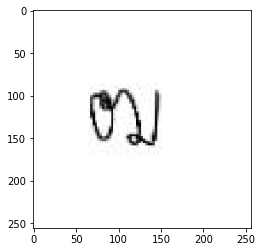

รูปบนนี้ทำนายว่าเป็น ฒ
--------------------------------------------------


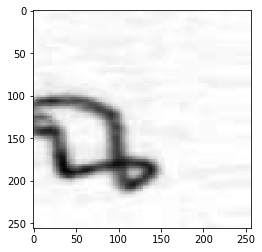

รูปบนนี้ทำนายว่าเป็น ฉ
--------------------------------------------------


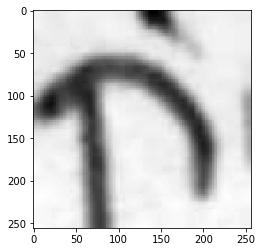

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


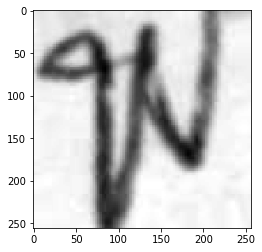

รูปบนนี้ทำนายว่าเป็น พ
--------------------------------------------------


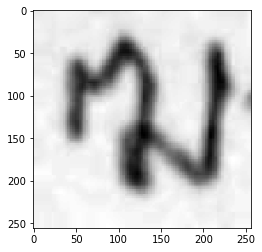

รูปบนนี้ทำนายว่าเป็น ฆ
--------------------------------------------------


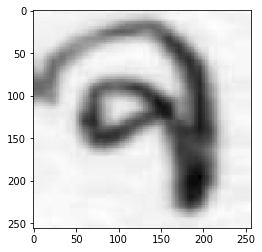

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


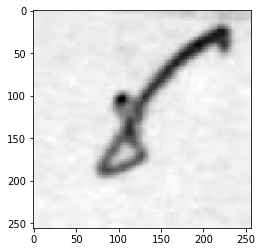

รูปบนนี้ทำนายว่าเป็น ช
--------------------------------------------------


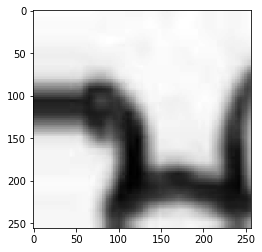

รูปบนนี้ทำนายว่าเป็น น
--------------------------------------------------


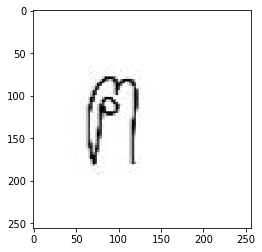

รูปบนนี้ทำนายว่าเป็น ฅ
--------------------------------------------------


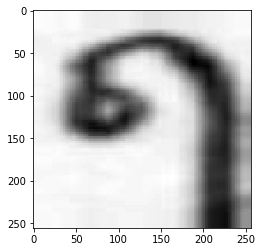

รูปบนนี้ทำนายว่าเป็น ฤ
--------------------------------------------------


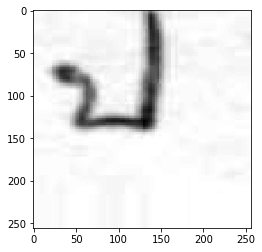

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


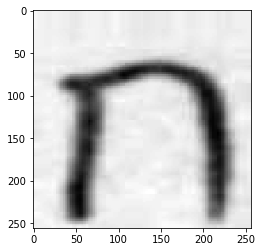

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------


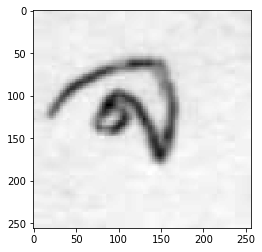

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


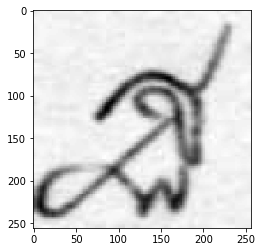

รูปบนนี้ทำนายว่าเป็น ฐ
--------------------------------------------------


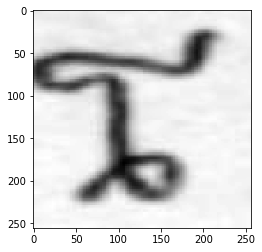

รูปบนนี้ทำนายว่าเป็น ฯ
--------------------------------------------------


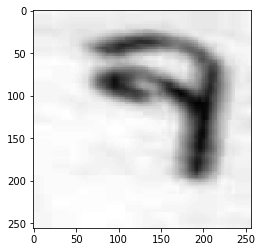

รูปบนนี้ทำนายว่าเป็น จ
--------------------------------------------------


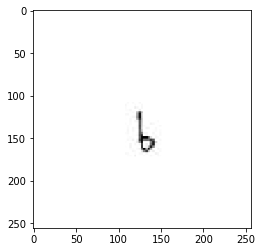

รูปบนนี้ทำนายว่าเป็น ำ
--------------------------------------------------


In [0]:
thai = "".join(train_set.class_indices.keys())
for i in range(len(test_set)):
  for img in test_set[i][0]:
      plt.imshow(img.reshape((256,256)), cmap='gray')
      plt.show()
      x = img_to_array(img)
      x = np.expand_dims(x, axis=0)
      y_pred = model.predict(x)
      arg_y = np.argmax(y_pred)
      pred_label = thai[arg_y]
      print('รูปบนนี้ทำนายว่าเป็น', pred_label)
      print('-'*50)
  break

In [0]:
def process_img(img_name):
  img = cv2.imread(img_name, cv2.IMREAD_GRAYSCALE)
  if (img is None):
    print('read unsuccess')
  print(img.shape)
  img = np.array(cv2.resize(img, (256, 256)))
  img = img.reshape(1,256,256,1)
  #img = img//255
  return img

(280, 280)


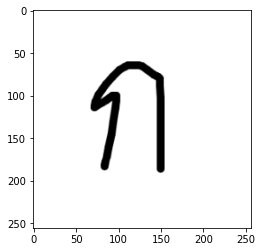

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------
(280, 280)


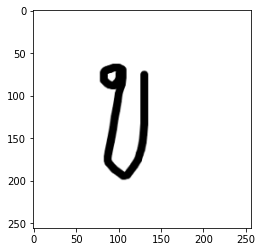

รูปบนนี้ทำนายว่าเป็น บ
--------------------------------------------------
(95, 95)


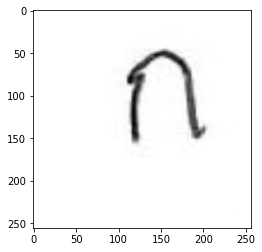

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------
(98, 98)


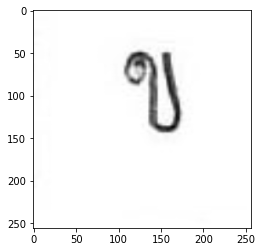

รูปบนนี้ทำนายว่าเป็น ฃ
--------------------------------------------------
(95, 95)


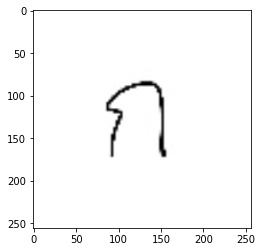

รูปบนนี้ทำนายว่าเป็น ก
--------------------------------------------------
(95, 95)


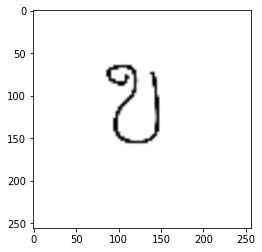

รูปบนนี้ทำนายว่าเป็น ข
--------------------------------------------------
(95, 95)


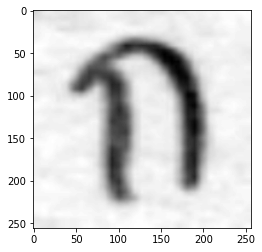

รูปบนนี้ทำนายว่าเป็น ว
--------------------------------------------------
(95, 95)


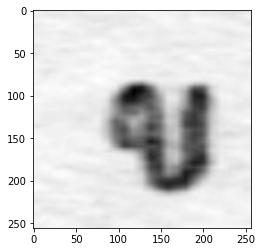

รูปบนนี้ทำนายว่าเป็น ป
--------------------------------------------------


In [0]:
#Unseen data

for img in test_images:
  img = process_img(img)
  plt.imshow(img.reshape((256,256)), cmap='gray')
  plt.show()
  #x = img_to_array(img)
  #x = np.expand_dims(x, axis=0)
  y_pred = model.predict(img)
  arg_y = np.argmax(y_pred)
  pred_label = thai[arg_y]
  print('รูปบนนี้ทำนายว่าเป็น', pred_label)
  print('-'*50)

In [0]:
for img in test_images:
  img_test = process_img(img)
  auto_preduct(img_test)